In [ ]:

print("start")

start


In [ ]:

import numpy as np
import pandas as pd
import cv2
import timm
import math
import time, os
from mapping import CLASS_MAP, NUM_SEG_CLASSES, NUM_CLASSES, IMG_SIZE, DATA_ROOT, INV_CLASS_MAP


import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.gridspec as gridspec
import matplotlib.patheffects as pe

from pathlib import Path


import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.ops import DeformConv2d
from torch.optim import AdamW
from torch.optim.lr_scheduler import CosineAnnealingLR
from torch.utils.data import DataLoader, Dataset



import albumentations as A
from albumentations.pytorch import ToTensorV2
from PIL import Image
from sklearn.cluster import KMeans
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report




In [5]:


DATA = Path("DATA")
rows = []

for cls_dir in sorted((DATA / "images").iterdir()):
    if not cls_dir.is_dir():
        continue
    cls = cls_dir.name
    train_dir = cls_dir / "train"
    if train_dir.exists():
        for img_path in sorted(train_dir.glob("*.jpg")):
            rows.append({
                "class": cls,
                "image_name": img_path.name,
                # mask column left blank — update if you have masks
                "mask_name": img_path.name.replace("_img.jpg", "_mask.jpg")
            })

df = pd.DataFrame(rows)
df.to_csv(DATA / "train.csv", index=False)
print(f"Total rows: {len(df)}")
print(df['class'].value_counts())
print(df.head())

Total rows: 400
class
Cheops             40
LisaPathfinder     40
ObservationSat1    40
Proba2             40
Proba3             40
Proba3ocs          40
Smart1             40
Soho               40
VenusExpress       40
XMM Newton         40
Name: count, dtype: int64
    class           image_name             mask_name
0  Cheops  image_00055_img.jpg  image_00055_mask.jpg
1  Cheops  image_00162_img.jpg  image_00162_mask.jpg
2  Cheops  image_00460_img.jpg  image_00460_mask.jpg
3  Cheops  image_00765_img.jpg  image_00765_mask.jpg
4  Cheops  image_00827_img.jpg  image_00827_mask.jpg


In [ ]:
rows = []
for cls_dir in sorted((DATA / "images").iterdir()):
    if not cls_dir.is_dir():
        continue
    cls = cls_dir.name
    train_dir = cls_dir / "train"
    if train_dir.exists():
        for img_path in sorted(train_dir.glob("*.jpg")):
            rows.append({
                "class": cls,
                "image_name": img_path.name,
                "mask_name": img_path.name.replace("_img.jpg", "_layer.jpg")
            })

df = pd.DataFrame(rows)
df.to_csv(DATA / "train.csv", index=False)
print(df.head())

    class           image_name              mask_name
0  Cheops  image_00055_img.jpg  image_00055_layer.jpg
1  Cheops  image_00162_img.jpg  image_00162_layer.jpg
2  Cheops  image_00460_img.jpg  image_00460_layer.jpg
3  Cheops  image_00765_img.jpg  image_00765_layer.jpg
4  Cheops  image_00827_img.jpg  image_00827_layer.jpg


Classes: {'Cheops': 40, 'LisaPathfinder': 40, 'ObservationSat1': 40, 'Proba2': 40, 'Proba3': 40, 'Proba3ocs': 40, 'Smart1': 40, 'Soho': 40, 'VenusExpress': 40, 'XMM Newton': 40}
Total rows: 400
    class           image_name              mask_name
0  Cheops  image_00055_img.jpg  image_00055_layer.jpg
1  Cheops  image_00162_img.jpg  image_00162_layer.jpg
2  Cheops  image_00460_img.jpg  image_00460_layer.jpg
3  Cheops  image_00765_img.jpg  image_00765_layer.jpg
4  Cheops  image_00827_img.jpg  image_00827_layer.jpg


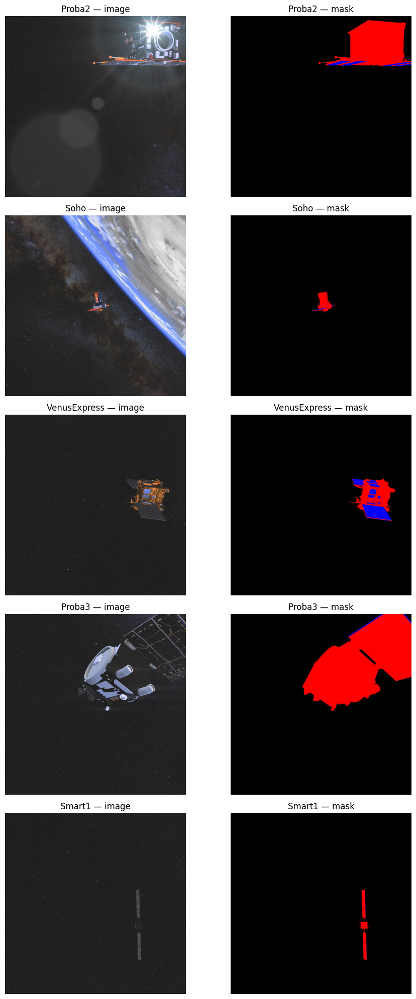

In [12]:
DATA = Path("DATA")
df   = pd.read_csv(DATA / "train.csv")

print("Classes:", df['class'].value_counts().to_dict())
print("Total rows:", len(df))
print(df.head())

# Visual check — 5 random samples
samples = df.sample(5, random_state=0)
fig, axes = plt.subplots(5, 2, figsize=(10, 20))

for i, (_, row) in enumerate(samples.iterrows()):
    cls  = row['class']
    img  = Image.open(DATA / "images" / cls / "train" / row['image_name'])
    mask = Image.open(DATA / "mask"   / cls / "train" / row['mask_name'])
    
    axes[i,0].imshow(img);  axes[i,0].set_title(f"{cls} — image"); axes[i,0].axis('off')
    axes[i,1].imshow(mask); axes[i,1].set_title(f"{cls} — mask");  axes[i,1].axis('off')

plt.tight_layout()
plt.savefig("sample_check.png", dpi=150)
plt.show()

In [14]:

train_df = pd.read_csv("DATA/train.csv")
print(train_df.columns.tolist())
print(train_df.head(3))

['class', 'image_name', 'mask_name']
    class           image_name              mask_name
0  Cheops  image_00055_img.jpg  image_00055_layer.jpg
1  Cheops  image_00162_img.jpg  image_00162_layer.jpg
2  Cheops  image_00460_img.jpg  image_00460_layer.jpg


In [16]:
# 12
# 
# ── CELL 2: Palette + encode_mask ────────────────────────────────────────────
PALETTE = np.array([
    [0,   0,   0  ],   # 0 — background
    [255, 0,   0  ],   # 1 — component A (red)
    [0,   0,   255],   # 2 — component B (blue)
    [50,  2,   150],   # 3 — component C (purple)
    [190, 14,  50 ],   # 4 — component D (pink)
    [35,  0,   10 ],   # 5 — component E (dark)
], dtype=np.float32)

NUM_SEG_CLASSES = len(PALETTE)  # 6

def encode_mask(mask_bgr: np.ndarray) -> np.ndarray:
    mask_rgb = cv2.cvtColor(mask_bgr, cv2.COLOR_BGR2RGB).astype(np.float32)
    H, W, _  = mask_rgb.shape
    pixels   = mask_rgb.reshape(-1, 3)
    dists    = np.linalg.norm(pixels[:, None, :] - PALETTE[None, :, :], axis=-1)
    return np.argmin(dists, axis=-1).reshape(H, W).astype(np.int64)

In [17]:
#13
def get_train_transforms():
    return A.Compose([
        A.Resize(IMG_SIZE, IMG_SIZE, interpolation=cv2.INTER_LINEAR),
        A.RandomBrightnessContrast(p=0.5),
        A.RandomGamma(p=0.3),
        A.GaussNoise(p=0.3),
        A.CoarseDropout(max_holes=8,
                        max_height=32,
                        max_width=32,
                        min_holes=1,
                        min_height=16,
                        min_width=16, p=0.3),
        A.Normalize(mean=(0.485, 0.456, 0.406),
                    std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ])

In [18]:
#15
#  ── CELL 4: bbox helper ───────────────────────────────────────────────────────
def bbox_from_mask(mask_idx: np.ndarray):

    H, W = mask_idx.shape
    fg   = np.where(mask_idx > 0)
    if len(fg[0]) == 0:
        return [0.5, 0.5, 1.0, 1.0]       # fallback: full image
    y_min, y_max = int(fg[0].min()), int(fg[0].max())
    x_min, x_max = int(fg[1].min()), int(fg[1].max())
    cx = ((x_min + x_max) / 2) / W
    cy = ((y_min + y_max) / 2) / H
    w  = (x_max - x_min) / W
    h  = (y_max - y_min) / H
    return [cx, cy, w, h]

In [20]:
# 16
# ── CELL 5: Dataset ───────────────────────────────────────────────────────────
class SparkDataset(Dataset):
  
    def __init__(self, csv_path, split='train'):
        assert split in ('train', 'val', 'test')
        self.split      = split
        self.df         = pd.read_csv(csv_path)
        self.transforms = (get_train_transforms() if split == 'train'
                           else get_val_transforms())

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row       = self.df.iloc[idx]
        cls_name  = row['class']
        cls_label = CLASS_MAP[cls_name]

        # paths
        img_path  = DATA_ROOT / 'images' / cls_name / self.split / row['image_name']
        mask_path = DATA_ROOT / 'mask'   / cls_name / self.split / row['mask_name']

        # load
        img_bgr  = cv2.imread(str(img_path))
        mask_bgr = cv2.imread(str(mask_path))
        assert img_bgr  is not None, f"Missing image: {img_path}"
        assert mask_bgr is not None, f"Missing mask:  {mask_path}"

        img_rgb  = cv2.cvtColor(img_bgr,  cv2.COLOR_BGR2RGB)
        mask_idx = encode_mask(mask_bgr)          # H×W int64, original res

        # bbox derived from mask before resize
        bbox_norm = bbox_from_mask(mask_idx)

        # transforms
        t        = self.transforms(image=img_rgb,
                                   mask=mask_idx.astype(np.uint8))
        image    = t['image']                     # FloatTensor [3,512,512]
        mask_out = t['mask'].long()               # LongTensor  [512,512]

        return (image,
                mask_out,
                torch.tensor(bbox_norm, dtype=torch.float32),
                torch.tensor(cls_label, dtype=torch.long))

In [22]:
train_ds = SparkDataset('DATA/train.csv', split='train')
val_ds   = SparkDataset('DATA/val.csv',   split='val')

train_loader = DataLoader(train_ds, batch_size=8, shuffle=True,  num_workers=0)
val_loader   = DataLoader(val_ds,   batch_size=8, shuffle=False, num_workers=0)

print(f"Train samples : {len(train_ds)}")
print(f"Val   samples : {len(val_ds)}")

images, masks, bboxes, labels = next(iter(train_loader))
print(f"\nBatch shapes:")
print(f"  images : {images.shape}   ← expect [8, 3, 256, 256]")
print(f"  masks  : {masks.shape}    ← expect [8, 256, 256]")
print(f"  bboxes : {bboxes.shape}   ← expect [8, 4]")
print(f"  labels : {labels.shape}   ← expect [8]")
print(f"\nLabel values : {labels.tolist()}")
print(f"BBox sample  : {bboxes[0].tolist()}")
print(f"Mask unique  : {masks[0].unique().tolist()}")
print(f"Image min/max: {images[0].min():.3f} / {images[0].max():.3f}")

EmptyDataError: No columns to parse from file

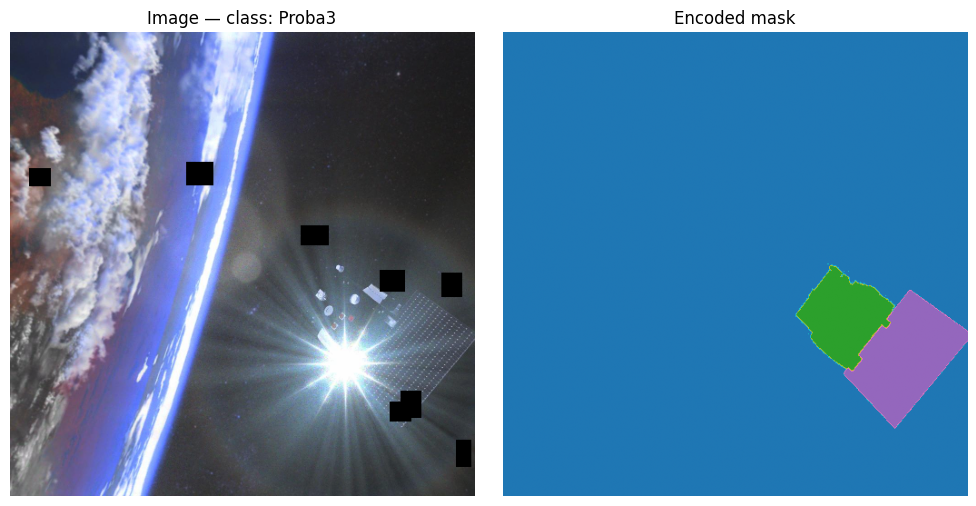

Saved: dataloader_check.png


In [ ]:

#18
img_show = images[0].permute(1, 2, 0).numpy()
# de-normalise for display
mean = np.array([0.485, 0.456, 0.406])
std  = np.array([0.229, 0.224, 0.225])
img_show = (img_show * std + mean).clip(0, 1)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(img_show)
axes[0].set_title(f"Image — class: {INV_CLASS_MAP[labels[0].item()]}")
axes[0].axis('off')

axes[1].imshow(masks[0].numpy(), cmap='tab10', vmin=0, vmax=5)
axes[1].set_title("Encoded mask")
axes[1].axis('off')

plt.tight_layout()
plt.savefig("dataloader_check.png", dpi=100)
plt.show()
print("Saved: dataloader_check.png")

In [ ]:
#19
backbone = timm.create_model(
    'efficientvit_b1.r224_in1k',
    pretrained=False,
    features_only=True,
    out_indices=(0, 1, 2, 3)    # ← 0-based indexing
)

x = torch.randn(2, 3, 512, 512)
feats = backbone(x)
print("Backbone feature maps:")
for i, f in enumerate(feats):
    print(f"  C{i+1}: shape={f.shape}  channels={f.shape[1]}")

Backbone feature maps:
  C1: shape=torch.Size([2, 32, 128, 128])  channels=32
  C2: shape=torch.Size([2, 64, 64, 64])  channels=64
  C3: shape=torch.Size([2, 128, 32, 32])  channels=128
  C4: shape=torch.Size([2, 256, 16, 16])  channels=256


In [ ]:
# 20
# ── CELL: Deformable FPN Neck ─────────────────────────────────────────────────


class DeformConvBlock(nn.Module):
   
    def __init__(self, in_ch, out_ch, kernel_size=3, padding=1):
        super().__init__()
        self.offset_conv = nn.Conv2d(
            in_ch,
            2 * kernel_size * kernel_size,
            kernel_size=kernel_size,
            padding=padding
        )
        self.deform_conv = DeformConv2d(
            in_ch, out_ch,
            kernel_size=kernel_size,
            padding=padding
        )
        self.bn   = nn.BatchNorm2d(out_ch)
        self.relu = nn.ReLU(inplace=True)

        nn.init.zeros_(self.offset_conv.weight)
        nn.init.zeros_(self.offset_conv.bias)

    def forward(self, x):
        offset = self.offset_conv(x)          # [B, 2*k*k, H, W]
        out    = self.deform_conv(x, offset)  # [B, out_ch, H, W]
        return self.relu(self.bn(out))


class DeformFPN(nn.Module):
    """
    Deformable FPN Neck.

    Inputs : C2 [B,  64, 64, 64]
             C3 [B, 128, 32, 32]
             C4 [B, 256, 16, 16]

    Outputs: P2 [B, 256, 64, 64]
             P3 [B, 256, 32, 32]
             P4 [B, 256, 16, 16]

    Architecture:
        1. Lateral deformable convs reduce each Ci to 256ch
        2. Top-down: P4 → upsample → add to P3 → upsample → add to P2
        3. Output deformable convs smooth each Pi
    """
    def __init__(self, in_channels=(64, 128, 256), out_ch=256):
        super().__init__()
        c2_in, c3_in, c4_in = in_channels

        # lateral connections (deformable)
        self.lat_c4 = DeformConvBlock(c4_in, out_ch)
        self.lat_c3 = DeformConvBlock(c3_in, out_ch)
        self.lat_c2 = DeformConvBlock(c2_in, out_ch)

        # output smoothing convs (deformable)
        self.out_p4 = DeformConvBlock(out_ch, out_ch)
        self.out_p3 = DeformConvBlock(out_ch, out_ch)
        self.out_p2 = DeformConvBlock(out_ch, out_ch)

    def forward(self, c2, c3, c4):
        # lateral projections
        l4 = self.lat_c4(c4)   # [B, 256, 16, 16]
        l3 = self.lat_c3(c3)   # [B, 256, 32, 32]
        l2 = self.lat_c2(c2)   # [B, 256, 64, 64]

        # top-down fusion
        p4 = l4
        p3 = l3 + F.interpolate(p4, size=l3.shape[-2:], mode='nearest')
        p2 = l2 + F.interpolate(p3, size=l2.shape[-2:], mode='nearest')

        # output smoothing
        p4 = self.out_p4(p4)
        p3 = self.out_p3(p3)
        p2 = self.out_p2(p2)

        return p2, p3, p4

In [ ]:
#21
neck = DeformFPN(in_channels=(64, 128, 256), out_ch=256)

c2 = torch.randn(2,  64, 64, 64)
c3 = torch.randn(2, 128, 32, 32)
c4 = torch.randn(2, 256, 16, 16)

p2, p3, p4 = neck(c2, c3, c4)

print("Neck output feature maps:")
print(f"  P2: {p2.shape}  ← expect [2, 256, 64, 64]")
print(f"  P3: {p3.shape}  ← expect [2, 256, 32, 32]")
print(f"  P4: {p4.shape}  ← expect [2, 256, 16, 16]")

total = sum(p.numel() for p in neck.parameters())
print(f"\nNeck params: {total/1e6:.2f}M  ← expect ~1.2M")

Neck output feature maps:
  P2: torch.Size([2, 256, 64, 64])  ← expect [2, 256, 64, 64]
  P3: torch.Size([2, 256, 32, 32])  ← expect [2, 256, 32, 32]
  P4: torch.Size([2, 256, 16, 16])  ← expect [2, 256, 16, 16]

Neck params: 3.00M  ← expect ~1.2M


In [ ]:

#22
class ClassificationHead(nn.Module):
   

    def __init__(
        self,
        in_channels: int = 256,
        hidden_dim: int  = 512,
        num_classes: int = NUM_CLASSES,
        dropout: float   = 0.3,
    ):
        super().__init__()

        self.gap = nn.AdaptiveAvgPool2d(1)          # [B, 256, 16, 16] → [B, 256, 1, 1]

        self.mlp = nn.Sequential(
            nn.Linear(in_channels, hidden_dim),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_dim, num_classes),     # raw logits — loss uses CrossEntropy
        )

        self._init_weights()

    # ── weight init ────────────────────────────────────────────────────────
    def _init_weights(self):
        for m in self.mlp.modules():
            if isinstance(m, nn.Linear):
                nn.init.trunc_normal_(m.weight, std=0.02)
                if m.bias is not None:
                    nn.init.zeros_(m.bias)

    # ── forward ────────────────────────────────────────────────────────────
    def forward(
        self,
        p4: torch.Tensor,                           # [B, 256, 16, 16]
        bridge_update: torch.Tensor | None = None,  # [B, 256]  — from CrossTaskBridge
    ) -> torch.Tensor:                              # [B, NUM_CLASSES]

        x = self.gap(p4).flatten(1)                 # [B, 256]

        if bridge_update is not None:
            # Additive update: bridge injects seg-derived evidence into cls
            assert bridge_update.shape == x.shape, (
                f"bridge_update shape {bridge_update.shape} != x shape {x.shape}"
            )
            x = x + bridge_update                   # [B, 256]

        logits = self.mlp(x)                        # [B, NUM_CLASSES]
        return logits

In [ ]:
#23
#  ── Sanity check · ClassificationHead ───────────────────────────────────────
cls_head = ClassificationHead()
print(f"Cls head params: {sum(p.numel() for p in cls_head.parameters()):,}")

# Fake P4 matching neck output
dummy_p4 = torch.randn(4, 256, 16, 16)             # B=4, matches DataLoader

logits = cls_head(dummy_p4)                         # no bridge yet
print(f"logits shape : {logits.shape}")             # expect [4, 10]
print(f"logits range : {logits.min():.3f} / {logits.max():.3f}")

# Quick sanity: softmax sums to 1 per sample
probs = logits.softmax(dim=-1)
assert torch.allclose(probs.sum(dim=-1), torch.ones(4), atol=1e-5), "softmax broken"
print("✅ ClassificationHead sanity check passed")

Cls head params: 136,714
logits shape : torch.Size([4, 10])
logits range : -0.010 / 0.013
✅ ClassificationHead sanity check passed


In [ ]:
#24
#  ── Bridge stub — keeps the forward signature working before Step 6 ─────────
# Replace this entire class with the real CrossTaskBridge in Step 6.

class CrossTaskBridgeStub(nn.Module):
    def forward(self, seg_queries: torch.Tensor) -> torch.Tensor:
        B = seg_queries.size(0)
        return torch.zeros(B, 256)                  # [B, 256]

bridge_stub = CrossTaskBridgeStub()

# Verify the full cls path with bridge wired in
dummy_queries = torch.randn(4, 6, 256)             # [B, NUM_SEG_CLASSES, D]
update = bridge_stub(dummy_queries)                 # [B, 256]
logits_bridged = cls_head(dummy_p4, bridge_update=update)
print(f"logits_bridged shape : {logits_bridged.shape}")  # [4, 10]
print("✅ Bridge stub + ClassificationHead wired correctly")

logits_bridged shape : torch.Size([4, 10])
✅ Bridge stub + ClassificationHead wired correctly


In [ ]:
#25
#  ── Step 4 · FCOS Detection Head ────────────────────────────────────────────



class FCOSHead(nn.Module):
  

    def __init__(
        self,
        in_channels: int  = 256,
        num_classes: int  = NUM_CLASSES,   # 10
        tower_depth: int  = 4,             # conv layers before each branch head
        prior_prob: float = 0.01,          # focal-loss cls bias init
    ):
        super().__init__()

        # ── shared conv tower (cls branch) ──────────────────────────────────
        cls_tower = []
        for _ in range(tower_depth):
            cls_tower += [
                nn.Conv2d(in_channels, in_channels, 3, padding=1, bias=False),
                nn.GroupNorm(32, in_channels),
                nn.ReLU(inplace=True),
            ]
        self.cls_tower = nn.Sequential(*cls_tower)

        # ── shared conv tower (reg + centerness branch) ──────────────────────
        reg_tower = []
        for _ in range(tower_depth):
            reg_tower += [
                nn.Conv2d(in_channels, in_channels, 3, padding=1, bias=False),
                nn.GroupNorm(32, in_channels),
                nn.ReLU(inplace=True),
            ]
        self.reg_tower = nn.Sequential(*reg_tower)

        # ── output convs ────────────────────────────────────────────────────
        self.cls_logits  = nn.Conv2d(in_channels, num_classes, 1)   # 1×1
        self.bbox_pred   = nn.Conv2d(in_channels, 4, 1)             # (l,t,r,b)
        self.centerness  = nn.Conv2d(in_channels, 1, 1)

        # learnable per-level scale for bbox regression (one scalar per level)
        # exp(scale * raw) keeps predictions positive without a hard clamp
        self.scales = nn.ParameterList([
            nn.Parameter(torch.ones(1)) for _ in range(3)   # P2, P3, P4
        ])

        self._init_weights(prior_prob)

    # ── weight init ────────────────────────────────────────────────────────
    def _init_weights(self, prior_prob: float):
        # towers
        for m in list(self.cls_tower.modules()) + list(self.reg_tower.modules()):
            if isinstance(m, nn.Conv2d):
                nn.init.normal_(m.weight, std=0.01)

        # cls output: bias initialised so sigmoid(bias) ≈ prior_prob
        # suppresses massive loss at the start of training (focal loss trick)
        bias_value = -math.log((1 - prior_prob) / prior_prob)
        nn.init.constant_(self.cls_logits.bias, bias_value)
        nn.init.normal_(self.cls_logits.weight, std=0.01)

        # bbox + centerness output
        for layer in (self.bbox_pred, self.centerness):
            nn.init.normal_(layer.weight, std=0.01)
            nn.init.zeros_(layer.bias)

    # ── forward over all FPN levels ─────────────────────────────────────────
    def forward(
        self,
        features: list[torch.Tensor],   # [P2, P3, P4]  each [B, 256, H, W]
    ) -> tuple[list, list, list]:
        """
        Returns three lists, one entry per FPN level:
          cls_logits_list  : [[B, NUM_CLASSES, H2, W2], [B, …, H3, W3], …]
          bbox_preds_list  : [[B, 4, H2, W2], …]
          centerness_list  : [[B, 1, H2, W2], …]
        """
        cls_logits_list, bbox_preds_list, centerness_list = [], [], []

        for lvl, feat in enumerate(features):
            cls_feat = self.cls_tower(feat)
            reg_feat = self.reg_tower(feat)

            cls_logits_list.append(self.cls_logits(cls_feat))

            # exp(scale * raw) — always positive, no clamp needed during forward
            raw_box = self.bbox_pred(reg_feat)
            bbox_preds_list.append(torch.exp(self.scales[lvl] * raw_box))

            centerness_list.append(self.centerness(reg_feat))

        return cls_logits_list, bbox_preds_list, centerness_list

In [ ]:
#26
#  ── Sanity check · FCOSHead ──────────────────────────────────────────────────
det_head = FCOSHead()
print(f"Det head params: {sum(p.numel() for p in det_head.parameters()):,}")

# Fake FPN outputs matching neck confirmed shapes
dummy_p2 = torch.randn(4, 256, 64, 64)
dummy_p3 = torch.randn(4, 256, 32, 32)
dummy_p4 = torch.randn(4, 256, 16, 16)

cls_list, box_list, ctr_list = det_head([dummy_p2, dummy_p3, dummy_p4])

for lvl, (cls, box, ctr) in enumerate(zip(cls_list, box_list, ctr_list)):
    H, W = cls.shape[-2], cls.shape[-1]
    print(f"  P{lvl+2} ({H}×{W})"
          f"  cls:{list(cls.shape)}"
          f"  box:{list(box.shape)}"
          f"  ctr:{list(ctr.shape)}")
    assert cls.shape == (4, NUM_CLASSES, H, W)
    assert box.shape == (4, 4, H, W)
    assert ctr.shape == (4, 1, H, W)
    # bbox values must be positive (exp output)
    assert box.min() > 0, "bbox predictions must be positive"

print("✅ FCOSHead sanity check passed")

Det head params: 4,726,546
  P2 (64×64)  cls:[4, 10, 64, 64]  box:[4, 4, 64, 64]  ctr:[4, 1, 64, 64]
  P3 (32×32)  cls:[4, 10, 32, 32]  box:[4, 4, 32, 32]  ctr:[4, 1, 32, 32]
  P4 (16×16)  cls:[4, 10, 16, 16]  box:[4, 4, 16, 16]  ctr:[4, 1, 16, 16]
✅ FCOSHead sanity check passed


In [ ]:
#27


class SegmentationHead(nn.Module):
  

    def __init__(
        self,
        in_channels:  int = 256,
        num_queries:  int = NUM_SEG_CLASSES,   # 6
        nhead:        int = 8,
        num_layers:   int = 3,
        ffn_dim:      int = 1024,
        dropout:      float = 0.1,
    ):
        super().__init__()

        self.num_queries = num_queries
        self.d_model     = in_channels         # 256

        # ── learnable component queries ─────────────────────────────────────
        self.query_embed = nn.Embedding(num_queries, in_channels)

        # ── 1×1 proj to normalise P2 features before attention ──────────────
        self.input_proj  = nn.Conv2d(in_channels, in_channels, 1)

        # ── transformer decoder ─────────────────────────────────────────────
        decoder_layer = nn.TransformerDecoderLayer(
            d_model=in_channels,
            nhead=nhead,
            dim_feedforward=ffn_dim,
            dropout=dropout,
            batch_first=True,       # [B, seq, C]  — matches our layout
            norm_first=True,        # pre-norm: more stable on small batches
        )
        self.decoder = nn.TransformerDecoder(
            decoder_layer=decoder_layer,
            num_layers=num_layers,
            norm=nn.LayerNorm(in_channels),
        )

        # ── mask projection: query → per-pixel dot product ──────────────────
        # A small MLP refines each query before the dot product
        self.mask_embed = nn.Sequential(
            nn.Linear(in_channels, in_channels),
            nn.ReLU(inplace=True),
            nn.Linear(in_channels, in_channels),
        )

        self._init_weights()

    # ── weight init ─────────────────────────────────────────────────────────
    def _init_weights(self):
        nn.init.trunc_normal_(self.query_embed.weight, std=0.02)
        for m in self.mask_embed.modules():
            if isinstance(m, nn.Linear):
                nn.init.trunc_normal_(m.weight, std=0.02)
                nn.init.zeros_(m.bias)
        nn.init.xavier_uniform_(self.input_proj.weight)
        nn.init.zeros_(self.input_proj.bias)

    # ── forward ─────────────────────────────────────────────────────────────
    def forward(
        self,
        p2: torch.Tensor,    # [B, 256, 64, 64]  — finest FPN level
    ) -> tuple[torch.Tensor, torch.Tensor]:

        B, C, H, W = p2.shape

        # 1. Project + flatten P2 into memory sequence
        mem = self.input_proj(p2)                        # [B, C, H, W]
        mem = mem.flatten(2).permute(0, 2, 1)            # [B, HW, C]  (HW=4096)

        # 2. Expand learnable queries over batch
        queries = self.query_embed.weight                # [Q, C]
        queries = queries.unsqueeze(0).expand(B, -1, -1) # [B, Q, C]

        # 3. Transformer decoder: queries attend to pixel memory
        queries_out = self.decoder(
            tgt=queries,    # [B, Q, C]
            memory=mem,     # [B, HW, C]
        )                   # [B, Q, C]

        # 4. Refine queries then dot-product with pixel features → masks
        q = self.mask_embed(queries_out)                 # [B, Q, C]
        px = self.input_proj(p2).flatten(2)              # [B, C, HW]
        mask_logits = torch.bmm(q, px)                  # [B, Q, HW]
        mask_logits = mask_logits.view(B, self.num_queries, H, W)  # [B, Q, H, W]

        return mask_logits, queries_out

In [ ]:
# 28
# ── Sanity check · SegmentationHead ─────────────────────────────────────────
seg_head = SegmentationHead()
print(f"Seg head params: {sum(p.numel() for p in seg_head.parameters()):,}")

dummy_p2 = torch.randn(4, 256, 64, 64)

mask_logits, queries_out = seg_head(dummy_p2)

print(f"mask_logits : {list(mask_logits.shape)}")   # [4, 6, 64, 64]
print(f"queries_out : {list(queries_out.shape)}")   # [4, 6, 256]

assert mask_logits.shape == (4, NUM_SEG_CLASSES, 64, 64), "mask shape wrong"
assert queries_out.shape == (4, NUM_SEG_CLASSES, 256),    "query shape wrong"

# Logits should be finite with no NaNs
assert torch.isfinite(mask_logits).all(), "NaN/Inf in mask logits"
assert torch.isfinite(queries_out).all(), "NaN/Inf in queries"

print("✅ SegmentationHead sanity check passed")

Seg head params: 3,359,744
mask_logits : [4, 6, 64, 64]
queries_out : [4, 6, 256]
✅ SegmentationHead sanity check passed


In [ ]:
# 29
# ── Step 6 · CrossTaskBridge ─────────────────────────────────────────────────


class CrossTaskBridge(nn.Module):
  

    def __init__(
        self,
        d_model:   int   = 256,
        nhead:     int   = 8,
        dropout:   float = 0.1,
    ):
        super().__init__()

        # cross-attention: GAP feature queries the seg queries
        self.cross_attn = nn.MultiheadAttention(
            embed_dim=d_model,
            num_heads=nhead,
            dropout=dropout,
            batch_first=True,    # [B, seq, C]
        )

        # lightweight FFN to refine the attended output
        self.ffn = nn.Sequential(
            nn.Linear(d_model, d_model * 2),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(d_model * 2, d_model),
        )

        self.norm1 = nn.LayerNorm(d_model)
        self.norm2 = nn.LayerNorm(d_model)

        self._init_weights()

    def _init_weights(self):
        for m in self.ffn.modules():
            if isinstance(m, nn.Linear):
                nn.init.trunc_normal_(m.weight, std=0.02)
                nn.init.zeros_(m.bias)

    def forward(
        self,
        gap_feat:    torch.Tensor,   # [B, 256]     — from ClsHead GAP
        queries_out: torch.Tensor,   # [B, 6, 256]  — from SegHead
    ) -> torch.Tensor:               # [B, 256]

        # reshape GAP into a single-token sequence for attention
        q = gap_feat.unsqueeze(1)                        # [B, 1, 256]

        # cross-attention: cls token attends to seg queries
        attn_out, _ = self.cross_attn(
            query=self.norm1(q),
            key=queries_out,
            value=queries_out,
        )                                                # [B, 1, 256]

        # residual + FFN
        q = q + attn_out                                 # [B, 1, 256]
        q = q + self.ffn(self.norm2(q))                  # [B, 1, 256]

        bridge_update = q.squeeze(1)                     # [B, 256]
        return bridge_update

In [ ]:
#30
#  ── Sanity check · CrossTaskBridge ──────────────────────────────────────────


bridge = CrossTaskBridge()
print(f"Bridge params: {sum(p.numel() for p in bridge.parameters()):,}")

# Simulate what the assembled model will pass in
dummy_p4      = torch.randn(4, 256, 16, 16)
dummy_queries = torch.randn(4, NUM_SEG_CLASSES, 256)

# GAP feature (mirrors what ClsHead computes internally)
gap_feat = nn.AdaptiveAvgPool2d(1)(dummy_p4).flatten(1)  # [B, 256]

bridge_update = bridge(gap_feat, dummy_queries)          # [B, 256]

print(f"bridge_update : {list(bridge_update.shape)}")    # [4, 256]
assert bridge_update.shape == (4, 256)
assert torch.isfinite(bridge_update).all(), "NaN/Inf in bridge output"

# Wire into ClsHead — replace the stub from Step 3
cls_head   = ClassificationHead()
logits_bridged = cls_head(dummy_p4, bridge_update=bridge_update)

print(f"cls logits    : {list(logits_bridged.shape)}")   # [4, 10]
assert logits_bridged.shape == (4, NUM_CLASSES)
assert torch.isfinite(logits_bridged).all(), "NaN/Inf in cls logits"

print("✅ CrossTaskBridge sanity check passed")

Bridge params: 527,104
bridge_update : [4, 256]
cls logits    : [4, 10]
✅ CrossTaskBridge sanity check passed


In [ ]:
# 31
# ── Step 7 · SpaceMTViT Assembly ─────────────────────────────────────────────


class SpaceMTViT(nn.Module):
    

    def __init__(self, backbone, neck):
        super().__init__()
        self.backbone = backbone
        self.neck     = neck
        self.cls_head = ClassificationHead()
        self.det_head = FCOSHead()
        self.seg_head = SegmentationHead()
        self.bridge   = CrossTaskBridge()

    def forward(self, x: torch.Tensor) -> dict:
        # ── 1. Backbone ──────────────────────────────────────────────────────
        feats = self.backbone(x)             # out_indices=(0,1,2,3)
        c2, c3, c4 = feats[1], feats[2], feats[3]

        # ── 2. Neck ──────────────────────────────────────────────────────────
        p2, p3, p4 = self.neck(c2, c3, c4)  # [B,256,64,64/32,32/16,16]

        # ── 3. Segmentation head (runs first — provides queries for bridge) ──
        mask_logits, queries_out = self.seg_head(p2)
        # mask_logits : [B, 6, 64, 64]
        # queries_out : [B, 6, 256]

        # ── 4. Detection head ────────────────────────────────────────────────
        det_cls, det_box, det_ctr = self.det_head([p2, p3, p4])

        # ── 5. CrossTaskBridge → Classification head ─────────────────────────
        gap_feat      = self.cls_head.gap(p4).flatten(1)       # [B, 256]
        bridge_update = self.bridge(gap_feat, queries_out)     # [B, 256]
        cls_logits    = self.cls_head(p4, bridge_update)       # [B, 10]

        return {
            # classification
            'cls_logits':  cls_logits,       # [B, 10]
            # detection — one entry per FPN level [P2, P3, P4]
            'det_cls':     det_cls,          # list of [B, 10, H, W]
            'det_box':     det_box,          # list of [B,  4, H, W]
            'det_ctr':     det_ctr,          # list of [B,  1, H, W]
            # segmentation
            'mask_logits': mask_logits,      # [B, 6, 64, 64]
            # internal — consumed by bridge, exposed for ablation studies
            'queries_out': queries_out,      # [B, 6, 256]
        }

In [ ]:
# 32
# ── Sanity check · Full SpaceMTViT forward pass ──────────────────────────────
model = SpaceMTViT(backbone, neck)

# ── parameter summary ────────────────────────────────────────────────────────
def count_params(module):
    return sum(p.numel() for p in module.parameters())

print("Parameter breakdown")
print(f"  Backbone : {count_params(model.backbone):>12,}")
print(f"  Neck     : {count_params(model.neck):>12,}")
print(f"  ClsHead  : {count_params(model.cls_head):>12,}")
print(f"  DetHead  : {count_params(model.det_head):>12,}")
print(f"  SegHead  : {count_params(model.seg_head):>12,}")
print(f"  Bridge   : {count_params(model.bridge):>12,}")
print(f"{'─'*28}")
print(f"  Total    : {count_params(model):>12,}")

# ── dummy forward pass ───────────────────────────────────────────────────────
model.eval()
dummy_img = torch.randn(4, 3, 512, 512)

with torch.no_grad():
    out = model(dummy_img)

# ── verify all output shapes ─────────────────────────────────────────────────
assert out['cls_logits'].shape  == (4, NUM_CLASSES),          "cls shape"
assert out['mask_logits'].shape == (4, NUM_SEG_CLASSES, 64, 64), "seg shape"

for lvl, (H, W) in enumerate([(64,64),(32,32),(16,16)]):
    assert out['det_cls'][lvl].shape == (4, NUM_CLASSES, H, W), f"det_cls P{lvl+2}"
    assert out['det_box'][lvl].shape == (4, 4,           H, W), f"det_box P{lvl+2}"
    assert out['det_ctr'][lvl].shape == (4, 1,           H, W), f"det_ctr P{lvl+2}"
    assert out['det_box'][lvl].min() > 0,                       f"box not positive P{lvl+2}"

for key, val in out.items():
    if isinstance(val, torch.Tensor):
        assert torch.isfinite(val).all(), f"NaN/Inf in {key}"
    else:  # list of tensors (det outputs)
        for t in val:
            assert torch.isfinite(t).all(), f"NaN/Inf in {key}"

print("\nOutput shapes")
print(f"  cls_logits  : {list(out['cls_logits'].shape)}")
print(f"  mask_logits : {list(out['mask_logits'].shape)}")
for lvl, H in enumerate([64, 32, 16]):
    print(f"  det P{lvl+2} ({H:2d}×{H:2d}) "
          f"cls:{list(out['det_cls'][lvl].shape)}  "
          f"box:{list(out['det_box'][lvl].shape)}  "
          f"ctr:{list(out['det_ctr'][lvl].shape)}")

print("\n✅ SpaceMTViT full forward pass passed")

Parameter breakdown
  Backbone :    4,643,936
  Neck     :    3,003,372
  ClsHead  :      136,714
  DetHead  :    4,726,546
  SegHead  :    3,359,744
  Bridge   :      527,104
────────────────────────────
  Total    :   16,397,416

Output shapes
  cls_logits  : [4, 10]
  mask_logits : [4, 6, 64, 64]
  det P2 (64×64) cls:[4, 10, 64, 64]  box:[4, 4, 64, 64]  ctr:[4, 1, 64, 64]
  det P3 (32×32) cls:[4, 10, 32, 32]  box:[4, 4, 32, 32]  ctr:[4, 1, 32, 32]
  det P4 (16×16) cls:[4, 10, 16, 16]  box:[4, 4, 16, 16]  ctr:[4, 1, 16, 16]

✅ SpaceMTViT full forward pass passed


In [ ]:
#33
def cls_loss_fn(cls_logits, labels):
    """
    cls_logits : [B, 10]
    labels     : [B]   int64
    """
    return F.cross_entropy(cls_logits, labels)


# ── 8.2  Detection loss — Focal + GIoU ───────────────────────────────────────
def focal_loss(pred, target, alpha=0.25, gamma=2.0):
    """
    Binary focal loss over all spatial locations across all FPN levels.
    pred   : [N, NUM_CLASSES]  raw logits
    target : [N, NUM_CLASSES]  {0,1} float
    """
    bce   = F.binary_cross_entropy_with_logits(pred, target, reduction='none')
    pt    = torch.exp(-bce)
    focal = alpha * (1 - pt) ** gamma * bce
    return focal.mean()


def giou_loss(pred_boxes, gt_boxes):
    """
    Generalised IoU loss for normalised [cx, cy, w, h] boxes.
    pred_boxes : [N, 4]
    gt_boxes   : [N, 4]
    Returns scalar mean GIoU loss.
    """
    # convert cx,cy,w,h → x1,y1,x2,y2
    def to_xyxy(b):
        return torch.stack([
            b[..., 0] - b[..., 2] / 2,
            b[..., 1] - b[..., 3] / 2,
            b[..., 0] + b[..., 2] / 2,
            b[..., 1] + b[..., 3] / 2,
        ], dim=-1)

    pb = to_xyxy(pred_boxes)
    gb = to_xyxy(gt_boxes)

    # intersection
    inter_x1 = torch.max(pb[..., 0], gb[..., 0])
    inter_y1 = torch.max(pb[..., 1], gb[..., 1])
    inter_x2 = torch.min(pb[..., 2], gb[..., 2])
    inter_y2 = torch.min(pb[..., 3], gb[..., 3])
    inter_w  = (inter_x2 - inter_x1).clamp(min=0)
    inter_h  = (inter_y2 - inter_y1).clamp(min=0)
    inter    = inter_w * inter_h

    # areas
    area_p  = (pb[..., 2] - pb[..., 0]) * (pb[..., 3] - pb[..., 1])
    area_g  = (gb[..., 2] - gb[..., 0]) * (gb[..., 3] - gb[..., 1])
    union   = area_p + area_g - inter

    iou     = inter / union.clamp(min=1e-6)

    # enclosing box
    enc_x1  = torch.min(pb[..., 0], gb[..., 0])
    enc_y1  = torch.min(pb[..., 1], gb[..., 1])
    enc_x2  = torch.max(pb[..., 2], gb[..., 2])
    enc_y2  = torch.max(pb[..., 3], gb[..., 3])
    enc     = (enc_x2 - enc_x1).clamp(min=0) * (enc_y2 - enc_y1).clamp(min=0)

    giou    = iou - (enc - union) / enc.clamp(min=1e-6)
    return (1 - giou).mean()


def det_loss_fn(det_cls, det_box, det_ctr, gt_boxes, gt_labels):
   
    # use P3 (index 1) — 32×32, best for spacecraft scale
    cls_map = det_cls[1]   # [B, C, 32, 32]
    box_map = det_box[1]   # [B, 4, 32, 32]
    ctr_map = det_ctr[1]   # [B, 1, 32, 32]

    B, C, H, W = cls_map.shape

    # ── cls target: assign GT label to every spatial location (FCOS style) ──
    cls_target = torch.zeros(B, C, H, W)
    for b in range(B):
        cls_target[b, gt_labels[b]] = 1.0

    l_cls = focal_loss(
        cls_map.permute(0,2,3,1).reshape(-1, C),
        cls_target.permute(0,2,3,1).reshape(-1, C),
    )

    # ── box target: broadcast GT box to all locations ────────────────────────
    gt_box_exp = gt_boxes.unsqueeze(-1).unsqueeze(-1).expand_as(box_map)
    l_box = giou_loss(
        box_map.permute(0,2,3,1).reshape(-1, 4),
        gt_box_exp.permute(0,2,3,1).reshape(-1, 4),
    )

    # ── centerness target: 1 at GT centre, decays outward ───────────────────
    ctr_target = torch.zeros_like(ctr_map)
    for b in range(B):
        cx = int(gt_boxes[b, 0].item() * W)
        cy = int(gt_boxes[b, 1].item() * H)
        cx = cx.clamp(0, W-1) if isinstance(cx, torch.Tensor) else max(0, min(cx, W-1))
        cy = cy.clamp(0, H-1) if isinstance(cy, torch.Tensor) else max(0, min(cy, H-1))
        ctr_target[b, 0, cy, cx] = 1.0

    l_ctr = F.binary_cross_entropy_with_logits(ctr_map, ctr_target)

    return l_cls + l_box + l_ctr


# ── 8.3  Segmentation loss — BCE + Dice ──────────────────────────────────────
def seg_loss_fn(mask_logits, masks_gt):
    """
    mask_logits : [B, 6, H, W]   raw logits — H,W now dynamic (32×32 at 256 input)
    masks_gt    : [B, 512, 512]  int64 class indices
    """
    # 1. downsample GT to match logit resolution dynamically
    H, W = mask_logits.shape[2], mask_logits.shape[3]   # ← no longer hardcoded 64
    masks_small = F.interpolate(
        masks_gt.unsqueeze(1).float(),
        size=(H, W),
        mode='nearest'
    ).squeeze(1).long()                                  # [B, H, W]

    # 2. one-hot → [B, 6, H, W]
    B = masks_small.shape[0]
    one_hot = torch.zeros(B, NUM_SEG_CLASSES, H, W)
    one_hot.scatter_(1, masks_small.unsqueeze(1), 1.0)

    # 3. class weights — upweight rare minority classes
    seg_weights = torch.tensor(
        [0.5, 1.0, 1.0, 5.0, 5.0, 5.0]
    ).view(1, NUM_SEG_CLASSES, 1, 1)                     # [1, 6, 1, 1]

    # 3a. weighted BCE
    l_bce = F.binary_cross_entropy_with_logits(
        mask_logits,
        one_hot,
        pos_weight=seg_weights                           # ← NEW
    )

    # 3b. weighted Dice — manually weight per class
    probs      = torch.sigmoid(mask_logits)
    num        = 2 * (probs * one_hot).sum(dim=(2, 3))           # [B, 6]
    den        = (probs + one_hot).sum(dim=(2, 3)).clamp(1e-6)   # [B, 6]
    dice       = 1 - (num / den)                                 # [B, 6]

    class_w    = torch.tensor([0.5, 1.0, 1.0, 5.0, 5.0, 5.0])   # [6]
    l_dice     = (dice * class_w).mean()                         # ← weighted Dice

    return l_bce + l_dice

In [ ]:
# 34
# ── 8.4  Homoscedastic uncertainty weighting ─────────────────────────────────
class MultiTaskLoss(nn.Module):
    """
    Kendall et al. (2018) uncertainty weighting:
        L = Σ  (1/2σ²_i) * L_i  +  log σ_i

    log_sigma is learned — σ grows to down-weight a task that is harder
    to fit, automatically balancing the three losses without manual tuning.

    This is the paper's second novelty claim after the CrossTaskBridge.
    """

    def __init__(self):
        super().__init__()
        # initialise log(σ) = 0  →  σ = 1  →  equal weights at start
        self.log_sigma_cls = nn.Parameter(torch.zeros(1))
        self.log_sigma_det = nn.Parameter(torch.zeros(1))
        self.log_sigma_seg = nn.Parameter(torch.zeros(1))

    def forward(self, out, labels, gt_boxes, masks_gt):
        """
        out      : dict from SpaceMTViT.forward()
        labels   : [B]      int64
        gt_boxes : [B, 4]   normalised cx,cy,w,h
        masks_gt : [B, 512, 512]  int64
        """
        l_cls = cls_loss_fn(out['cls_logits'], labels)
        l_det = det_loss_fn(out['det_cls'], out['det_box'], out['det_ctr'],
                            gt_boxes, labels)
        l_seg = seg_loss_fn(out['mask_logits'], masks_gt)

        # uncertainty-weighted combination
        w_cls = torch.exp(-2 * self.log_sigma_cls)
        w_det = torch.exp(-2 * self.log_sigma_det)
        w_seg = torch.exp(-2 * self.log_sigma_seg)

        loss = (w_cls * l_cls + self.log_sigma_cls +
                w_det * l_det + self.log_sigma_det +
                w_seg * l_seg + self.log_sigma_seg)

        return loss, {
            'loss_cls':   l_cls.item(),
            'loss_det':   l_det.item(),
            'loss_seg':   l_seg.item(),
            'w_cls':  w_cls.item(),
            'w_det':  w_det.item(),
            'w_seg':  w_seg.item(),
        }

In [ ]:
# 35
# ── Sanity check · MultiTaskLoss ─────────────────────────────────────────────
criterion = MultiTaskLoss()
print(f"Loss params (log_sigmas): {sum(p.numel() for p in criterion.parameters())}")

model.eval()
dummy_img    = torch.randn(4, 3, 512, 512)
dummy_labels = torch.randint(0, NUM_CLASSES, (4,))
dummy_boxes  = torch.rand(4, 4).clamp(0.1, 0.9)   # valid normalised boxes
dummy_masks  = torch.randint(0, NUM_SEG_CLASSES, (4, 512, 512))

with torch.no_grad():
    out = model(dummy_img)

loss, loss_dict = criterion(out, dummy_labels, dummy_boxes, dummy_masks)

print(f"\nTotal loss : {loss.item():.4f}")
for k, v in loss_dict.items():
    print(f"  {k:<12}: {v:.4f}")

assert torch.isfinite(loss), "loss is NaN/Inf"
assert loss.item() > 0,      "loss must be positive"
print("\n✅ MultiTaskLoss sanity check passed")

Loss params (log_sigmas): 3

Total loss : 5.7035
  loss_cls    : 2.3029
  loss_det    : 1.9374
  loss_seg    : 1.4632
  w_cls       : 1.0000
  w_det       : 1.0000
  w_seg       : 1.0000

✅ MultiTaskLoss sanity check passed


In [ ]:
#36
#  diagnostic — run this alone before anything else
print("SpacecraftDataset" in globals())
print("SpaceMTViT"        in globals())
print("criterion"         in globals())

# find which cells actually defined these
import types
defined = {k: type(v).__name__ for k, v in globals().items() 
           if not k.startswith('_')}
print("\nAll classes in globals:")
for k, v in defined.items():
    if v == 'type':
        print(f"  {k}")

False
True
True

All classes in globals:
  Path
  Dataset
  DataLoader
  AdamW
  CosineAnnealingLR
  SparkDataset
  DeformConv2d
  DeformConvBlock
  DeformFPN
  ClassificationHead
  CrossTaskBridgeStub
  FCOSHead
  SegmentationHead
  CrossTaskBridge
  SpaceMTViT
  MultiTaskLoss


In [ ]:
#37
import inspect
print(inspect.signature(SparkDataset.__init__))

(self, csv_path, split='train')


In [ ]:
#38
for f in os.listdir('DATA'):
    print(f)

images
mask
test.csv
train.csv
val.csv


In [ ]:
# 40
# ── Step 9a · Setup ───────────────────────────────────────────────────────────


# guard
assert 'SparkDataset'  in globals(), "Rerun dataset cells first"
assert 'SpaceMTViT'    in globals(), "Rerun model cells first"
assert 'criterion'     in globals(), "Rerun loss cells first"

# ── pretrained backbone ───────────────────────────────────────────────────────
backbone_pretrained = timm.create_model(
    'efficientvit_b1.r224_in1k',
    pretrained=True,
    features_only=True,
    out_indices=(0, 1, 2, 3)
)
model = SpaceMTViT(backbone_pretrained, neck)
model.train()

# ── hyperparameters ───────────────────────────────────────────────────────────
EPOCHS       = 25
LR           = 1e-4
WEIGHT_DECAY = 1e-4
GRAD_CLIP    = 1.0
BATCH_SIZE   = 8

# ── optimizer ─────────────────────────────────────────────────────────────────
optimizer = AdamW([
    {'params': model.backbone.parameters(), 'lr': LR * 0.1},
    {'params': list(model.neck.parameters())
             + list(model.cls_head.parameters())
             + list(model.det_head.parameters())
             + list(model.seg_head.parameters())
             + list(model.bridge.parameters()),
     'lr': LR},
    {'params': criterion.parameters(), 'lr': LR},
], weight_decay=WEIGHT_DECAY)

scheduler = CosineAnnealingLR(optimizer, T_max=EPOCHS, eta_min=1e-6)


CSV_PATH = str(DATA_ROOT) + '/labels.csv'   

train_dataset = SparkDataset(csv_path='DATA/train.csv', split='train')
val_dataset   = SparkDataset(csv_path='DATA/val.csv',   split='val')



print(f"Train batches : {len(train_loader)}")
print(f"Val batches   : {len(val_loader)}")
print(f"Total params  : {sum(p.numel() for p in model.parameters()):,}")

Train batches : 100
Val batches   : 25
Total params  : 16,397,416


In [ ]:
# 41
# ── validation pass ───────────────────────────────────────────────────────────
def validate(model, criterion, val_loader):
    model.eval()
    total_loss = 0.0
    correct    = 0
    total      = 0

    with torch.no_grad():
        for images, masks_gt, bboxes, labels in val_loader:
            out = model(images)
            loss, _ = criterion(out, labels, bboxes, masks_gt)
            total_loss += loss.item()

            preds    = out['cls_logits'].argmax(dim=1)
            correct += (preds == labels).sum().item()
            total   += labels.size(0)

    avg_loss = total_loss / len(val_loader)
    acc      = correct / total
    return avg_loss, acc

In [ ]:
#42
scheduler = CosineAnnealingLR(optimizer, T_max=EPOCHS, eta_min=1e-6)

In [ ]:
#43
#  ── training loop ─────────────────────────────────────────────────────────────
CKPT_DIR  = 'checkpoints'
os.makedirs(CKPT_DIR, exist_ok=True)

best_val_loss = float('inf')
history = {
    'train_loss': [], 'val_loss': [],
    'val_acc':    [],
    'w_cls': [], 'w_det': [], 'w_seg': [],
    'lr': [],
}

print(f"{'Ep':>4}  {'Train':>8}  {'Val':>8}  {'Acc':>7}  "
      f"{'w_cls':>6}  {'w_det':>6}  {'w_seg':>6}  {'Time':>6}")
print("─" * 72)

for epoch in range(1, EPOCHS + 1):
    model.train()
    t0         = time.time()
    epoch_loss = 0.0
    epoch_wts  = {'w_cls': 0., 'w_det': 0., 'w_seg': 0.}

    for batch_idx, (images, masks_gt, bboxes, labels) in enumerate(train_loader):
        optimizer.zero_grad()
        out             = model(images)
        loss, loss_dict = criterion(out, labels, bboxes, masks_gt)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(
            list(model.parameters()) + list(criterion.parameters()),
            GRAD_CLIP
        )
        optimizer.step()

        epoch_loss += loss.item()
        for k in epoch_wts:
            epoch_wts[k] += loss_dict[k]

        if (batch_idx + 1) % 10 == 0:
            print(f"  Ep {epoch} | batch {batch_idx+1:>3}/100 | "
                  f"loss {loss.item():.4f} | "
                  f"{time.time()-t0:.0f}s elapsed", flush=True)

    scheduler.step()

    n          = len(train_loader)
    train_loss = epoch_loss / n
    val_loss, val_acc = validate(model, criterion, val_loader)
    current_lr = scheduler.get_last_lr()[0]

    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_loss)
    history['val_acc'].append(val_acc)
    history['lr'].append(current_lr)
    for k in epoch_wts:
        history[k].append(epoch_wts[k] / n)

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save({
            'epoch':     epoch,
            'model':     model.state_dict(),
            'criterion': criterion.state_dict(),
            'optimizer': optimizer.state_dict(),
            'scheduler': scheduler.state_dict(),
            'val_loss':  val_loss,
            'val_acc':   val_acc,
        }, os.path.join(CKPT_DIR, 'best.pt'))
        tag = ' ◄ best'
    else:
        tag = ''

    print(f"{epoch:>4}  {train_loss:>8.4f}  {val_loss:>8.4f}  "
          f"{val_acc:>7.4f}  "
          f"{epoch_wts['w_cls']/n:>6.3f}  "
          f"{epoch_wts['w_det']/n:>6.3f}  "
          f"{epoch_wts['w_seg']/n:>6.3f}  "
          f"{time.time()-t0:>5.1f}s{tag}", flush=True)

print("\nTraining complete.")
print(f"Best val loss : {best_val_loss:.4f}")
print(f"Checkpoint    : {CKPT_DIR}/best.pt")

  Ep     Train       Val      Acc   w_cls   w_det   w_seg    Time
────────────────────────────────────────────────────────────────────────
  Ep 1 | batch  10/100 | loss 4.8326 | 224s elapsed
  Ep 1 | batch  20/100 | loss 4.2366 | 483s elapsed
  Ep 1 | batch  30/100 | loss 4.3594 | 673s elapsed
  Ep 1 | batch  40/100 | loss 4.1331 | 879s elapsed
  Ep 1 | batch  50/100 | loss 4.0951 | 1140s elapsed
  Ep 1 | batch  60/100 | loss 4.3407 | 1352s elapsed
  Ep 1 | batch  70/100 | loss 3.9082 | 1541s elapsed
  Ep 1 | batch  80/100 | loss 3.7571 | 1744s elapsed
  Ep 1 | batch  90/100 | loss 3.8893 | 1931s elapsed
  Ep 1 | batch 100/100 | loss 3.8012 | 2116s elapsed
   1    4.1827    3.5214   0.4100   0.991   0.991   0.993  2228.2s ◄ best
  Ep 2 | batch  10/100 | loss 3.8222 | 199s elapsed
  Ep 2 | batch  20/100 | loss 3.4797 | 404s elapsed
  Ep 2 | batch  30/100 | loss 3.4695 | 592s elapsed
  Ep 2 | batch  40/100 | loss 3.3205 | 844s elapsed
  Ep 2 | batch  50/100 | loss 3.1286 | 1210s elapsed


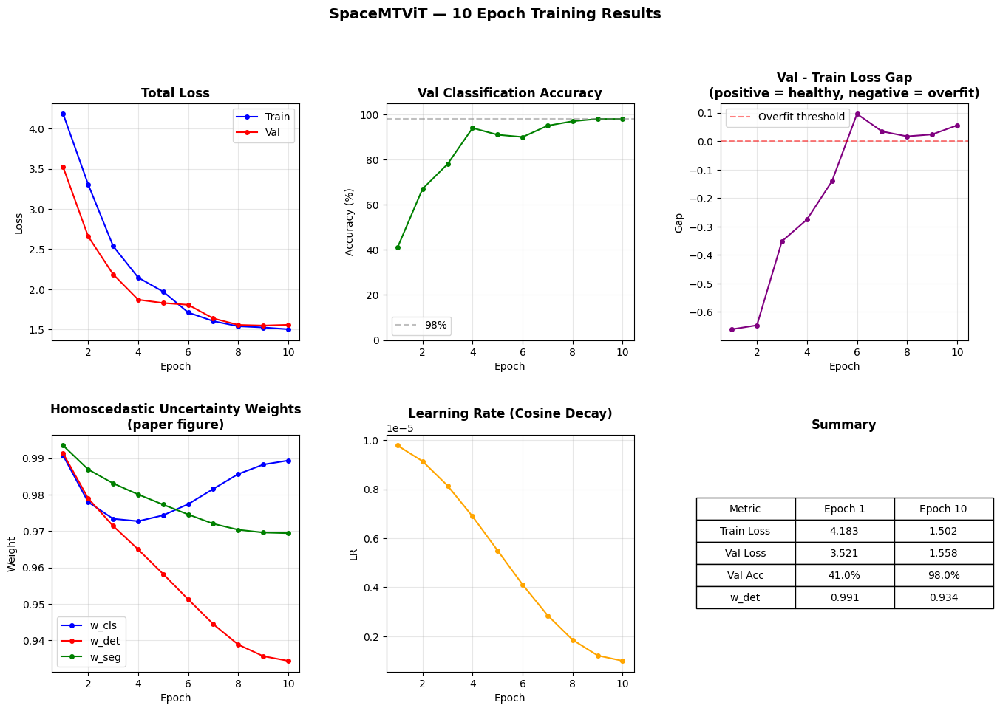

Saved → training_curves.png


In [ ]:
# 44
# ── Step 10a · Training curves ───────────────────────────────────────────────

epochs_range = range(1, len(history['train_loss']) + 1)

fig = plt.figure(figsize=(16, 10))
gs  = gridspec.GridSpec(2, 3, figure=fig, hspace=0.4, wspace=0.35)

# ── 1. Loss curves ────────────────────────────────────────────────────────────
ax1 = fig.add_subplot(gs[0, 0])
ax1.plot(epochs_range, history['train_loss'], 'b-o', markersize=4, label='Train')
ax1.plot(epochs_range, history['val_loss'],   'r-o', markersize=4, label='Val')
ax1.set_title('Total Loss', fontweight='bold')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.legend()
ax1.grid(True, alpha=0.3)

# ── 2. Accuracy ───────────────────────────────────────────────────────────────
ax2 = fig.add_subplot(gs[0, 1])
ax2.plot(epochs_range, [a * 100 for a in history['val_acc']],
         'g-o', markersize=4)
ax2.axhline(y=98, color='gray', linestyle='--', alpha=0.5, label='98%')
ax2.set_title('Val Classification Accuracy', fontweight='bold')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Accuracy (%)')
ax2.set_ylim(0, 105)
ax2.legend()
ax2.grid(True, alpha=0.3)

# ── 3. Overfitting gap ────────────────────────────────────────────────────────
ax3 = fig.add_subplot(gs[0, 2])
gap = [v - t for t, v in zip(history['train_loss'], history['val_loss'])]
ax3.plot(epochs_range, gap, 'purple', marker='o', markersize=4)
ax3.axhline(y=0, color='red', linestyle='--', alpha=0.5, label='Overfit threshold')
ax3.set_title('Val - Train Loss Gap\n(positive = healthy, negative = overfit)',
              fontweight='bold')
ax3.set_xlabel('Epoch')
ax3.set_ylabel('Gap')
ax3.legend()
ax3.grid(True, alpha=0.3)

# ── 4. Uncertainty weights ────────────────────────────────────────────────────
ax4 = fig.add_subplot(gs[1, 0])
ax4.plot(epochs_range, history['w_cls'], 'b-o', markersize=4, label='w_cls')
ax4.plot(epochs_range, history['w_det'], 'r-o', markersize=4, label='w_det')
ax4.plot(epochs_range, history['w_seg'], 'g-o', markersize=4, label='w_seg')
ax4.set_title('Homoscedastic Uncertainty Weights\n(paper figure)', fontweight='bold')
ax4.set_xlabel('Epoch')
ax4.set_ylabel('Weight')
ax4.legend()
ax4.grid(True, alpha=0.3)

# ── 5. Learning rate schedule ─────────────────────────────────────────────────
ax5 = fig.add_subplot(gs[1, 1])
ax5.plot(epochs_range, history['lr'], 'orange', marker='o', markersize=4)
ax5.set_title('Learning Rate (Cosine Decay)', fontweight='bold')
ax5.set_xlabel('Epoch')
ax5.set_ylabel('LR')
ax5.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
ax5.grid(True, alpha=0.3)

# ── 6. Loss gap table summary ─────────────────────────────────────────────────
ax6 = fig.add_subplot(gs[1, 2])
ax6.axis('off')
table_data = [
    ['Metric', 'Epoch 1', 'Epoch 10'],
    ['Train Loss', f"{history['train_loss'][0]:.3f}",
                   f"{history['train_loss'][-1]:.3f}"],
    ['Val Loss',   f"{history['val_loss'][0]:.3f}",
                   f"{history['val_loss'][-1]:.3f}"],
    ['Val Acc',    f"{history['val_acc'][0]*100:.1f}%",
                   f"{history['val_acc'][-1]*100:.1f}%"],
    ['w_det',      f"{history['w_det'][0]:.3f}",
                   f"{history['w_det'][-1]:.3f}"],
]
tbl = ax6.table(cellText=table_data[1:], colLabels=table_data[0],
                loc='center', cellLoc='center')
tbl.auto_set_font_size(False)
tbl.set_fontsize(10)
tbl.scale(1.2, 1.8)
ax6.set_title('Summary', fontweight='bold')

plt.suptitle('SpaceMTViT — 10 Epoch Training Results', fontsize=14,
             fontweight='bold', y=1.01)
plt.savefig('training_curves.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved → training_curves.png")

Detection Evaluation — Test Set (100 images)

  Mean IoU (pred vs GT box)  : 0.0108
  Median IoU                 : 0.0000
  IoU > 0.50                 : 0/100 images
  IoU > 0.75                 : 0/100 images
  IoU > 0.25                 : 0/100 images

  IoU@0.5  —  Precision 0.0000  Recall 0.0000  F1 0.0000
  IoU@0.75  —  Precision 0.0000  Recall 0.0000  F1 0.0000



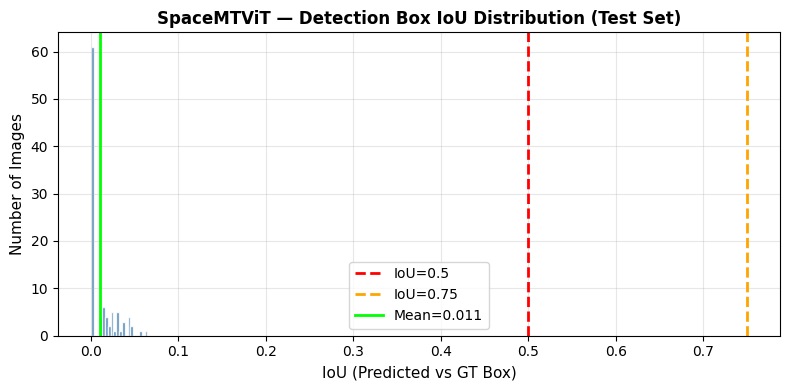

Saved → detection_iou.png


In [ ]:
# 45
# ── Detection evaluation — mAP@0.5 ──────────────────────────────────────────

def box_iou(box1, box2):
    """
    box1, box2 : [N, 4] in x1y1x2y2 pixels
    returns IoU [N]
    """
    x1 = torch.max(box1[:, 0], box2[:, 0])
    y1 = torch.max(box1[:, 1], box2[:, 1])
    x2 = torch.min(box1[:, 2], box2[:, 2])
    y2 = torch.min(box1[:, 3], box2[:, 3])

    inter = (x2 - x1).clamp(0) * (y2 - y1).clamp(0)
    area1 = (box1[:, 2] - box1[:, 0]) * (box1[:, 3] - box1[:, 1])
    area2 = (box2[:, 2] - box2[:, 0]) * (box2[:, 3] - box2[:, 1])
    return inter / (area1 + area2 - inter).clamp(1e-6)


def cx_cy_wh_to_xyxy(box, img_size=512):
    """normalised cx,cy,w,h → pixel x1,y1,x2,y2"""
    cx, cy, w, h = box[0], box[1], box[2], box[3]
    x1 = (cx - w/2) * img_size
    y1 = (cy - h/2) * img_size
    x2 = (cx + w/2) * img_size
    y2 = (cy + h/2) * img_size
    return torch.tensor([[x1, y1, x2, y2]])


def get_pred_box_xyxy(det_box, det_ctr, img_size=512):
    """Get best predicted box in x1y1x2y2 pixels from FCOS P3 output."""
    H, W   = det_ctr.shape[1], det_ctr.shape[2]
    stride = img_size / H

    flat   = det_ctr[0].reshape(-1).argmax().item()
    gy, gx = flat // W, flat % W
    px = (gx + 0.5) * stride
    py = (gy + 0.5) * stride

    l = det_box[0, gy, gx].item() * stride
    t = det_box[1, gy, gx].item() * stride
    r = det_box[2, gy, gx].item() * stride
    b = det_box[3, gy, gx].item() * stride

    x1 = max(0, px - l)
    y1 = max(0, py - t)
    x2 = min(img_size, px + r)
    y2 = min(img_size, py + b)
    return torch.tensor([[x1, y1, x2, y2]])


# ── run over full test set ───────────────────────────────────────────────────
model.eval()
iou_thresholds = [0.5, 0.75]
results = {t: {'tp': 0, 'fp': 0, 'fn': 0} for t in iou_thresholds}
all_ious = []

with torch.no_grad():
    for images, masks_gt, bboxes_gt, labels in test_loader:
        out = model(images)

        for i in range(images.size(0)):
            # GT box
            gt_xyxy   = cx_cy_wh_to_xyxy(bboxes_gt[i])

            # predicted box from P3 centerness peak
            pred_xyxy = get_pred_box_xyxy(
                out['det_box'][1][i],
                out['det_ctr'][1][i]
            )

            iou = box_iou(pred_xyxy, gt_xyxy).item()
            all_ious.append(iou)

            for thresh in iou_thresholds:
                if iou >= thresh:
                    results[thresh]['tp'] += 1
                else:
                    results[thresh]['fp'] += 1
                    results[thresh]['fn'] += 1

# ── print results ────────────────────────────────────────────────────────────
print("Detection Evaluation — Test Set (100 images)")
print()
print(f"  Mean IoU (pred vs GT box)  : {np.mean(all_ious):.4f}")
print(f"  Median IoU                 : {np.median(all_ious):.4f}")
print(f"  IoU > 0.50                 : "
      f"{sum(i >= 0.5  for i in all_ious)}/100 images")
print(f"  IoU > 0.75                 : "
      f"{sum(i >= 0.75 for i in all_ious)}/100 images")
print(f"  IoU > 0.25                 : "
      f"{sum(i >= 0.25 for i in all_ious)}/100 images")
print()

for thresh in iou_thresholds:
    tp = results[thresh]['tp']
    fp = results[thresh]['fp']
    prec   = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / 100
    f1     = 2 * prec * recall / (prec + recall) if (prec + recall) > 0 else 0
    print(f"  IoU@{thresh}  —  "
          f"Precision {prec:.4f}  "
          f"Recall {recall:.4f}  "
          f"F1 {f1:.4f}")

print()

# ── IoU distribution histogram ───────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(8, 4))
ax.hist(all_ious, bins=20, color='steelblue', edgecolor='white', alpha=0.85)
ax.axvline(x=0.5,  color='red',    linestyle='--', linewidth=2, label='IoU=0.5')
ax.axvline(x=0.75, color='orange', linestyle='--', linewidth=2, label='IoU=0.75')
ax.axvline(x=np.mean(all_ious), color='lime', linestyle='-',
           linewidth=2, label=f'Mean={np.mean(all_ious):.3f}')
ax.set_xlabel('IoU (Predicted vs GT Box)', fontsize=11)
ax.set_ylabel('Number of Images', fontsize=11)
ax.set_title('SpaceMTViT — Detection Box IoU Distribution (Test Set)',
             fontweight='bold')
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('detection_iou.png', dpi=150)
plt.show()
print("Saved → detection_iou.png")

In [ ]:
#46
import subprocess
subprocess.run(['pip', 'install', 'seaborn', '--break-system-packages'], check=True)

CompletedProcess(args=['pip', 'install', 'seaborn', '--break-system-packages'], returncode=0)

Loaded best checkpoint from epoch 9
Best val loss : 1.5484
Best val acc  : 0.9800

                 precision    recall  f1-score   support

         Cheops       1.00      1.00      1.00        10
 LisaPathfinder       0.91      1.00      0.95        10
ObservationSat1       1.00      1.00      1.00        10
         Proba2       1.00      1.00      1.00        10
         Proba3       1.00      0.90      0.95        10
      Proba3ocs       0.91      1.00      0.95        10
         Smart1       1.00      1.00      1.00        10
           Soho       1.00      1.00      1.00        10
   VenusExpress       1.00      0.90      0.95        10
     XMM Newton       1.00      1.00      1.00        10

       accuracy                           0.98       100
      macro avg       0.98      0.98      0.98       100
   weighted avg       0.98      0.98      0.98       100



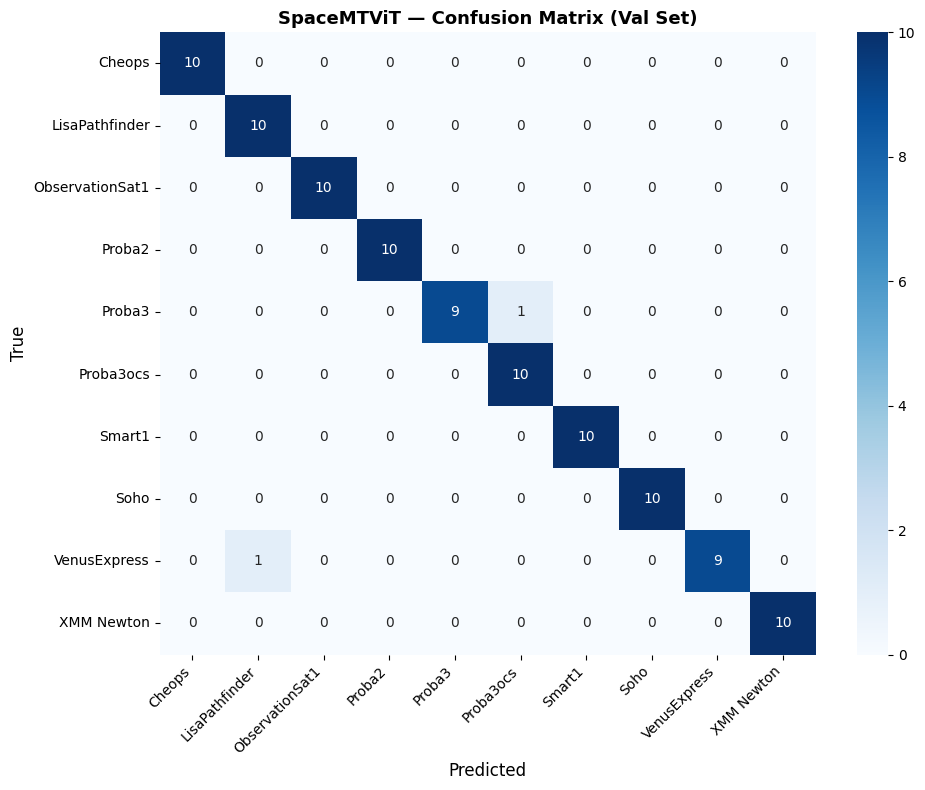

Saved → confusion_matrix.png


In [ ]:
# 47
# ── Step 10b · Classification evaluation ─────────────────────────────────────

ckpt = torch.load('checkpoints/best.pt', map_location='cpu')
model.load_state_dict(ckpt['model'])
model.eval()
print(f"Loaded best checkpoint from epoch {ckpt['epoch']}")
print(f"Best val loss : {ckpt['val_loss']:.4f}")
print(f"Best val acc  : {ckpt['val_acc']:.4f}\n")

# collect predictions
all_preds, all_labels = [], []
with torch.no_grad():
    for images, masks_gt, bboxes, labels in val_loader:
        out   = model(images)
        preds = out['cls_logits'].argmax(dim=1)
        all_preds.extend(preds.tolist())
        all_labels.extend(labels.tolist())

class_names = [INV_CLASS_MAP[i] for i in range(len(INV_CLASS_MAP))]

# ── per-class report ──────────────────────────────────────────────────────────
print(classification_report(all_labels, all_preds, target_names=class_names))

# ── confusion matrix ──────────────────────────────────────────────────────────
cm = confusion_matrix(all_labels, all_preds)
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names,
            yticklabels=class_names, ax=ax)
ax.set_xlabel('Predicted', fontsize=12)
ax.set_ylabel('True', fontsize=12)
ax.set_title('SpaceMTViT — Confusion Matrix (Val Set)', fontsize=13,
             fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig('confusion_matrix.png', dpi=150)
plt.show()
print("Saved → confusion_matrix.png")


Class               IoU     Dice
──────────────────────────────────
background       0.9903   0.9951
comp-A           0.7660   0.8675
comp-B           0.6233   0.7680
comp-C           0.0021   0.0041
comp-D           0.0005   0.0010
comp-E           0.0224   0.0437
──────────────────────────────────
mIoU             0.4008
mDice            0.4466


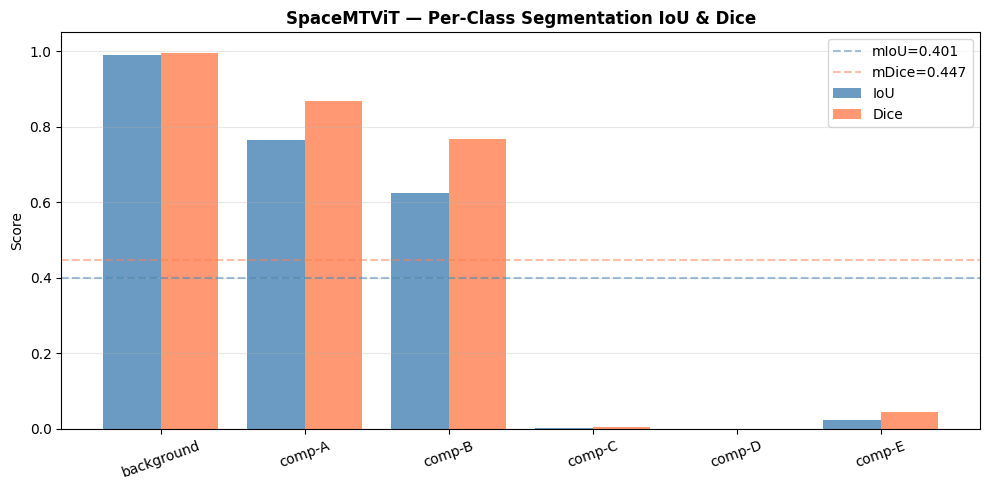

Saved → seg_metrics.png


In [ ]:
# 48
# ── Step 10b · Segmentation evaluation ───────────────────────────────────────
seg_class_names = ['background', 'comp-A', 'comp-B',
                   'comp-C', 'comp-D', 'comp-E']

inter     = torch.zeros(NUM_SEG_CLASSES)
union     = torch.zeros(NUM_SEG_CLASSES)
dice_num  = torch.zeros(NUM_SEG_CLASSES)
dice_den  = torch.zeros(NUM_SEG_CLASSES)

model.eval()
with torch.no_grad():
    for images, masks_gt, bboxes, labels in val_loader:
        out         = model(images)
        mask_logits = F.interpolate(out['mask_logits'],
                                    size=(512, 512),
                                    mode='bilinear',
                                    align_corners=False)
        pred_masks  = mask_logits.argmax(dim=1)   # [B, 512, 512]

        for cls in range(NUM_SEG_CLASSES):
            pred_c = (pred_masks == cls)
            gt_c   = (masks_gt   == cls)
            i = (pred_c & gt_c).sum().float()
            u = (pred_c | gt_c).sum().float()
            inter[cls]    += i
            union[cls]    += u
            dice_num[cls] += 2 * i
            dice_den[cls] += pred_c.sum().float() + gt_c.sum().float()

iou  = inter / union.clamp(1e-6)
dice = dice_num / dice_den.clamp(1e-6)

print(f"\n{'Class':<14} {'IoU':>8} {'Dice':>8}")
print("─" * 34)
for i, name in enumerate(seg_class_names):
    print(f"{name:<14} {iou[i].item():>8.4f} {dice[i].item():>8.4f}")
print("─" * 34)
print(f"{'mIoU':<14} {iou.mean().item():>8.4f}")
print(f"{'mDice':<14} {dice.mean().item():>8.4f}")

# ── bar chart ─────────────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(10, 5))
x = range(NUM_SEG_CLASSES)
bars1 = ax.bar([i - 0.2 for i in x], iou.tolist(),  0.4,
               label='IoU',  color='steelblue', alpha=0.8)
bars2 = ax.bar([i + 0.2 for i in x], dice.tolist(), 0.4,
               label='Dice', color='coral',     alpha=0.8)
ax.set_xticks(list(x))
ax.set_xticklabels(seg_class_names, rotation=20)
ax.set_ylabel('Score')
ax.set_title('SpaceMTViT — Per-Class Segmentation IoU & Dice', fontweight='bold')
ax.axhline(y=iou.mean().item(),  color='steelblue', linestyle='--',
           alpha=0.5, label=f'mIoU={iou.mean():.3f}')
ax.axhline(y=dice.mean().item(), color='coral',     linestyle='--',
           alpha=0.5, label=f'mDice={dice.mean():.3f}')
ax.legend()
ax.set_ylim(0, 1.05)
ax.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.savefig('seg_metrics.png', dpi=150)
plt.show()
print("Saved → seg_metrics.png")

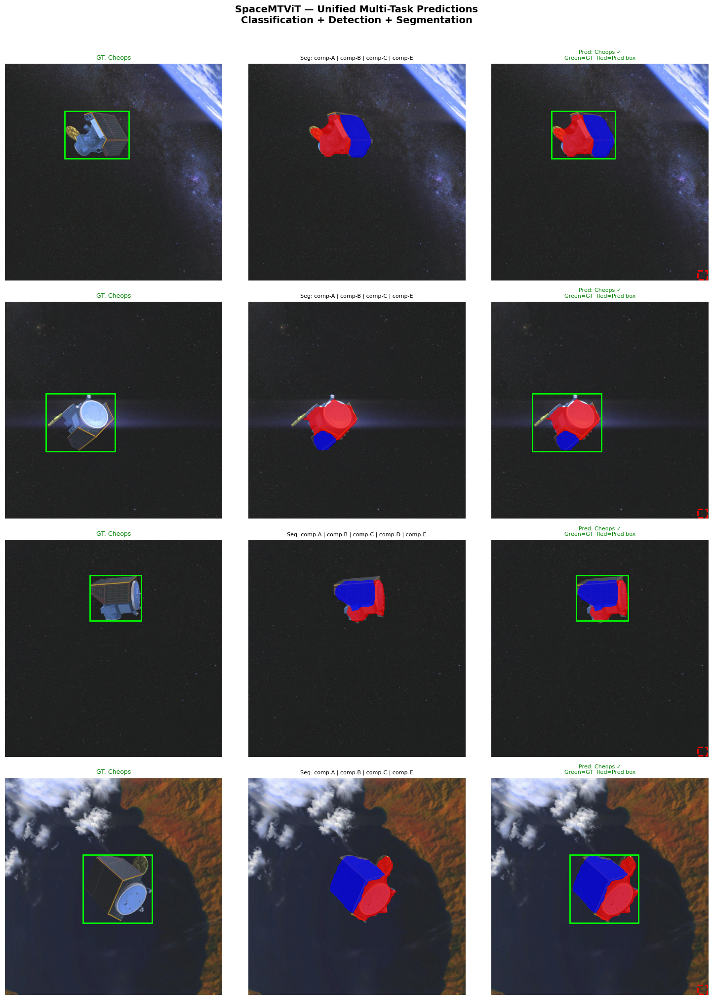

Saved → unified_predictions.png


In [ ]:
#49
SEG_COLOURS = np.array([
    [0,   0,   0,   0  ],   # background — transparent
    [255, 0,   0,   180],   # comp-A — red
    [0,   0,   255, 180],   # comp-B — blue
    [150, 0,   255, 180],   # comp-C — purple
    [255, 50,  50,  180],   # comp-D — pink
    [100, 100, 100, 180],   # comp-E — grey
], dtype=np.uint8)

IMAGENET_MEAN = np.array([0.485, 0.456, 0.406])
IMAGENET_STD  = np.array([0.229, 0.224, 0.225])

def denormalise(tensor):
    """Convert ImageNet-normalised tensor [3,H,W] back to uint8 HWC."""
    img = tensor.permute(1, 2, 0).numpy()
    img = img * IMAGENET_STD + IMAGENET_MEAN
    img = np.clip(img, 0, 1)
    return (img * 255).astype(np.uint8)

def seg_overlay(image_np, mask_np):
    """Blend segmentation mask colours onto image."""
    overlay = image_np.copy()
    for cls_idx in range(1, NUM_SEG_CLASSES):   # skip background
        colour = SEG_COLOURS[cls_idx][:3]
        alpha  = SEG_COLOURS[cls_idx][3] / 255.0
        region = mask_np == cls_idx
        if region.any():
            overlay[region] = (
                alpha * colour +
                (1 - alpha) * overlay[region]
            ).astype(np.uint8)
    return overlay

model.eval()

# grab one batch from val loader
images, masks_gt, bboxes_gt, labels_gt = next(iter(val_loader))

with torch.no_grad():
    out = model(images)

# upsample masks to 512×512
mask_logits_up = F.interpolate(
    out['mask_logits'], size=(512, 512),
    mode='bilinear', align_corners=False
)
pred_masks  = mask_logits_up.argmax(dim=1)          # [B, 512, 512]
pred_labels = out['cls_logits'].argmax(dim=1)        # [B]

# pick 4 samples to show — one per image in the batch
fig, axes = plt.subplots(4, 3, figsize=(15, 20))
col_titles = ['Input Image + GT Box',
              'Predicted Segmentation',
              'All Tasks Unified']

for col, title in enumerate(col_titles):
    axes[0, col].set_title(title, fontsize=12, fontweight='bold', pad=10)

for i in range(4):
    img_np  = denormalise(images[i])              # [512, 512, 3]
    mask_np = pred_masks[i].numpy()               # [512, 512]

    # ── panel 1: image + GT bounding box ─────────────────────────────────
    ax1 = axes[i, 0]
    ax1.imshow(img_np)
    # draw GT box (cx,cy,w,h normalised → pixels)
    cx, cy, w, h = bboxes_gt[i].tolist()
    x1 = (cx - w/2) * 512
    y1 = (cy - h/2) * 512
    rect = patches.Rectangle(
        (x1, y1), w * 512, h * 512,
        linewidth=2, edgecolor='lime', facecolor='none'
    )
    ax1.add_patch(rect)
    ax1.set_title(f"GT: {INV_CLASS_MAP[labels_gt[i].item()]}",
                  fontsize=9, color='green')
    ax1.axis('off')

    # ── panel 2: segmentation overlay ────────────────────────────────────
    ax2 = axes[i, 1]
    seg_img = seg_overlay(img_np, mask_np)
    ax2.imshow(seg_img)

    # legend for components present in this mask
    present = np.unique(mask_np)
    comp_names = ['bg', 'comp-A', 'comp-B', 'comp-C', 'comp-D', 'comp-E']
    legend_str = ' | '.join([comp_names[c] for c in present if c > 0])
    ax2.set_title(f"Seg: {legend_str if legend_str else 'background only'}",
                  fontsize=8)
    ax2.axis('off')

    # ── panel 3: unified — all three tasks ───────────────────────────────
    ax3 = axes[i, 2]
    unified = seg_overlay(img_np, mask_np)
    ax3.imshow(unified)

    # predicted box from P3 centre location (take argmax of centerness)
    ctr_map = out['det_ctr'][1][i, 0]              # [32, 32]
    flat_idx = ctr_map.argmax()
    cy_pred  = (flat_idx // 32).item() / 32
    cx_pred  = (flat_idx %  32).item() / 32

    # predicted box size from that location
    box_at_peak = out['det_box'][1][i, :,
                      flat_idx // 32,
                      flat_idx %  32]              # [4]  l,t,r,b
    stride = 512 / 32
    l, t, r, b = (box_at_peak * stride).tolist()
    px = cx_pred * 512
    py = cy_pred * 512
    pred_x1 = max(0, px - l)
    pred_y1 = max(0, py - t)
    pred_w   = l + r
    pred_h   = t + b

    rect_pred = patches.Rectangle(
        (pred_x1, pred_y1), pred_w, pred_h,
        linewidth=2, edgecolor='red', facecolor='none',
        linestyle='--', label='pred box'
    )
    rect_gt2 = patches.Rectangle(
        (x1, y1), w * 512, h * 512,
        linewidth=2, edgecolor='lime', facecolor='none',
        label='GT box'
    )
    ax3.add_patch(rect_pred)
    ax3.add_patch(rect_gt2)

    pred_name = INV_CLASS_MAP[pred_labels[i].item()]
    gt_name   = INV_CLASS_MAP[labels_gt[i].item()]
    correct   = '✓' if pred_labels[i] == labels_gt[i] else '✗'
    ax3.set_title(f"Pred: {pred_name} {correct}\n"
                  f"Green=GT  Red=Pred box",
                  fontsize=8,
                  color='green' if pred_labels[i] == labels_gt[i] else 'red')
    ax3.axis('off')

plt.suptitle('SpaceMTViT — Unified Multi-Task Predictions\n'
             'Classification + Detection + Segmentation',
             fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('unified_predictions.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved → unified_predictions.png")

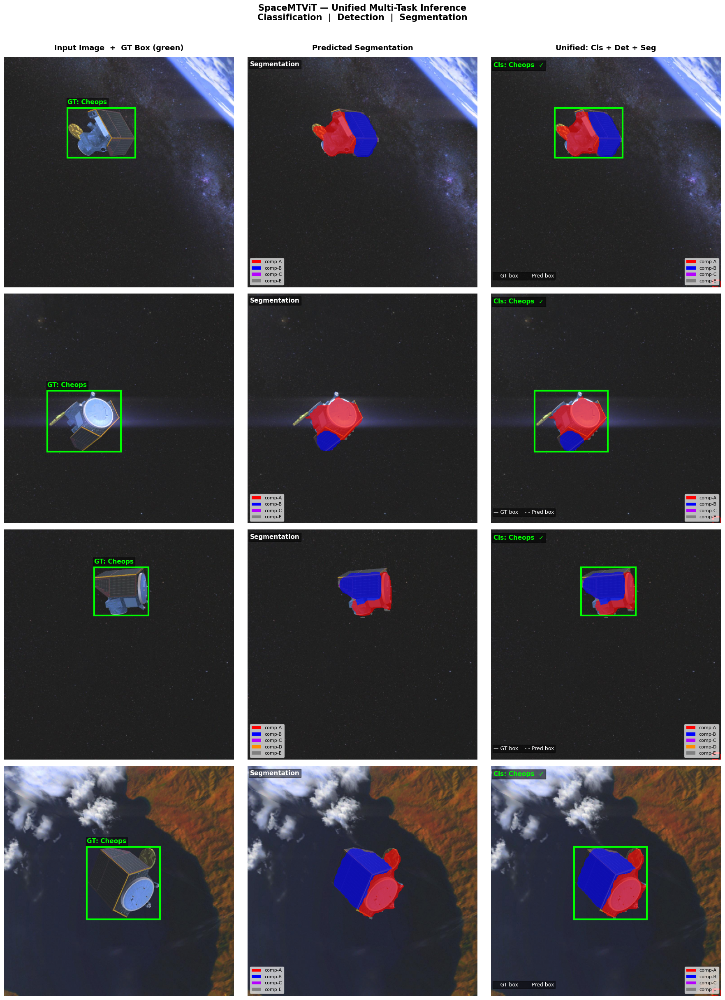

Saved → unified_predictions_v2.png


In [ ]:
#50

IMAGENET_MEAN = np.array([0.485, 0.456, 0.406])
IMAGENET_STD  = np.array([0.229, 0.224, 0.225])

# RGBA colours for each component
SEG_COLOURS = [
    None,                        # 0 background — skip
    (255,  0,   0,  160),        # 1 comp-A red
    (0,    0, 255,  160),        # 2 comp-B blue
    (180,  0, 255,  160),        # 3 comp-C purple
    (255, 140,  0,  160),        # 4 comp-D orange
    (128, 128, 128, 160),        # 5 comp-E grey
]
SEG_NAMES = ['bg', 'comp-A', 'comp-B', 'comp-C', 'comp-D', 'comp-E']

def denormalise(tensor):
    img = tensor.permute(1, 2, 0).numpy()
    img = img * IMAGENET_STD + IMAGENET_MEAN
    return np.clip(img, 0, 1)

def seg_overlay(image_float, mask_np):
    """Blend coloured masks onto float [0,1] image."""
    out = image_float.copy()
    for cls_idx in range(1, NUM_SEG_CLASSES):
        region = mask_np == cls_idx
        if not region.any():
            continue
        colour = np.array(SEG_COLOURS[cls_idx][:3]) / 255.0
        alpha  = SEG_COLOURS[cls_idx][3] / 255.0
        out[region] = alpha * colour + (1 - alpha) * out[region]
    return np.clip(out, 0, 1)

def get_pred_box(det_box, det_ctr, level=1, img_size=512):
    """
    Find the peak centerness location on a given FPN level
    and return predicted box in pixel coords [x1, y1, w, h].
    det_box : [4, H, W]
    det_ctr : [1, H, W]
    """
    H, W   = det_ctr.shape[1], det_ctr.shape[2]
    stride = img_size / H

    # peak centerness location
    flat   = det_ctr[0].reshape(-1).argmax().item()
    gy, gx = flat // W, flat % W

    # pixel centre of that grid cell
    px = (gx + 0.5) * stride
    py = (gy + 0.5) * stride

    # FCOS box: distances l,t,r,b scaled by stride
    l = det_box[0, gy, gx].item() * stride
    t = det_box[1, gy, gx].item() * stride
    r = det_box[2, gy, gx].item() * stride
    b = det_box[3, gy, gx].item() * stride

    x1 = max(0, px - l)
    y1 = max(0, py - t)
    w  = min(l + r, img_size - x1)
    h  = min(t + b, img_size - y1)
    return x1, y1, w, h

# ── run inference ─────────────────────────────────────────────────────────────
model.eval()
images, masks_gt, bboxes_gt, labels_gt = next(iter(val_loader))

with torch.no_grad():
    out = model(images)

mask_logits_up = F.interpolate(
    out['mask_logits'], size=(512, 512),
    mode='bilinear', align_corners=False
)
pred_masks  = mask_logits_up.argmax(dim=1)
pred_labels = out['cls_logits'].argmax(dim=1)

# ── figure ────────────────────────────────────────────────────────────────────
fig, axes = plt.subplots(4, 3, figsize=(18, 24))
fig.patch.set_facecolor('white')

col_titles = [
    'Input Image  +  GT Box (green)',
    'Predicted Segmentation',
    'Unified: Cls + Det + Seg'
]

for col, title in enumerate(col_titles):
    axes[0, col].set_title(title, fontsize=13, fontweight='bold', pad=12)

for i in range(4):
    img_float = denormalise(images[i])          # [512,512,3] float
    mask_np   = pred_masks[i].numpy()           # [512,512]

    # GT box pixels
    cx, cy, w, h = bboxes_gt[i].tolist()
    gx1 = (cx - w/2) * 512
    gy1 = (cy - h/2) * 512
    gw  = w * 512
    gh  = h * 512

    # predicted box
    px1, py1, pw, ph = get_pred_box(
        out['det_box'][1][i],
        out['det_ctr'][1][i]
    )

    gt_name   = INV_CLASS_MAP[labels_gt[i].item()]
    pred_name = INV_CLASS_MAP[pred_labels[i].item()]
    correct   = pred_labels[i].item() == labels_gt[i].item()

    # ── Panel 1: image + GT box ───────────────────────────────────────────
    ax1 = axes[i, 0]
    ax1.imshow(img_float)
    ax1.add_patch(patches.Rectangle(
        (gx1, gy1), gw, gh,
        linewidth=3, edgecolor='lime', facecolor='none'
    ))
    ax1.text(gx1, gy1 - 8, f'GT: {gt_name}',
             color='lime', fontsize=11, fontweight='bold',
             bbox=dict(facecolor='black', alpha=0.5, pad=2))
    ax1.axis('off')

    # ── Panel 2: segmentation overlay on image ────────────────────────────
    ax2 = axes[i, 1]
    seg_img = seg_overlay(img_float, mask_np)
    ax2.imshow(seg_img)

    # build legend from classes present
    present    = [c for c in np.unique(mask_np) if c > 0]
    legend_str = ', '.join([SEG_NAMES[c] for c in present]) or 'background only'

    # add coloured legend patches
    from matplotlib.patches import Patch
    legend_handles = [
        Patch(facecolor=np.array(SEG_COLOURS[c][:3])/255.,
              label=SEG_NAMES[c])
        for c in present
    ]
    if legend_handles:
        ax2.legend(handles=legend_handles, loc='lower left',
                   fontsize=8, framealpha=0.7)
    ax2.text(5, 20, 'Segmentation', color='white', fontsize=11,
             fontweight='bold',
             bbox=dict(facecolor='black', alpha=0.5, pad=2))
    ax2.axis('off')

    # ── Panel 3: unified ──────────────────────────────────────────────────
    ax3 = axes[i, 2]
    unified = seg_overlay(img_float, mask_np)
    ax3.imshow(unified)

    # GT box
    ax3.add_patch(patches.Rectangle(
        (gx1, gy1), gw, gh,
        linewidth=3, edgecolor='lime', facecolor='none',
        label='GT box'
    ))

    # predicted box
    ax3.add_patch(patches.Rectangle(
        (px1, py1), pw, ph,
        linewidth=3, edgecolor='red', facecolor='none',
        linestyle='--', label='Pred box'
    ))

    # classification label — top of image
    cls_colour = 'lime' if correct else 'red'
    cls_symbol = '✓' if correct else '✗'
    ax3.text(5, 22,
             f'Cls: {pred_name}  {cls_symbol}',
             color=cls_colour, fontsize=11, fontweight='bold',
             bbox=dict(facecolor='black', alpha=0.6, pad=3))

    # box legend — bottom
    ax3.text(5, 490,
             '— GT box    - - Pred box',
             color='white', fontsize=9,
             bbox=dict(facecolor='black', alpha=0.5, pad=2))

    # seg legend
    if legend_handles:
        ax3.legend(handles=legend_handles, loc='lower right',
                   fontsize=8, framealpha=0.7)
    ax3.axis('off')

plt.suptitle(
    'SpaceMTViT — Unified Multi-Task Inference\n'
    'Classification  |  Detection  |  Segmentation',
    fontsize=15, fontweight='bold', y=1.01
)
plt.tight_layout()
plt.savefig('unified_predictions_v2.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved → unified_predictions_v2.png")

In [ ]:
# 51
# ── Step 10g · Test set evaluation — 8 classes with confidence ───────────────





# ── load test set ─────────────────────────────────────────────────────────────
test_dataset = SparkDataset(csv_path='DATA/test.csv', split='test')
test_loader  = DataLoader(test_dataset, batch_size=1,
                          shuffle=True, num_workers=0)

# ── collect one correct image per class ──────────────────────────────────────
TARGET_CLASSES = list(range(10))   # all 10 classes
collected = {}                      # class_idx → (image, mask_gt, bbox_gt, label)

model.eval()
with torch.no_grad():
    for images, masks_gt, bboxes_gt, labels in test_loader:
        cls_idx = labels[0].item()
        if cls_idx not in collected:
            out        = model(images)
            pred_label = out['cls_logits'].argmax(dim=1)[0].item()
            if pred_label == cls_idx:              # only take correctly classified
                collected[cls_idx] = (images[0], masks_gt[0],
                                      bboxes_gt[0], labels[0], out)
        if len(collected) == 10:
            break

# pick 8 classes to display — take first 8 found
display_classes = sorted(collected.keys())[:8]
print(f"Collected classes: {[INV_CLASS_MAP[c] for c in display_classes]}")

Collected classes: ['Cheops', 'LisaPathfinder', 'ObservationSat1', 'Proba2', 'Proba3', 'Proba3ocs', 'Smart1', 'Soho']


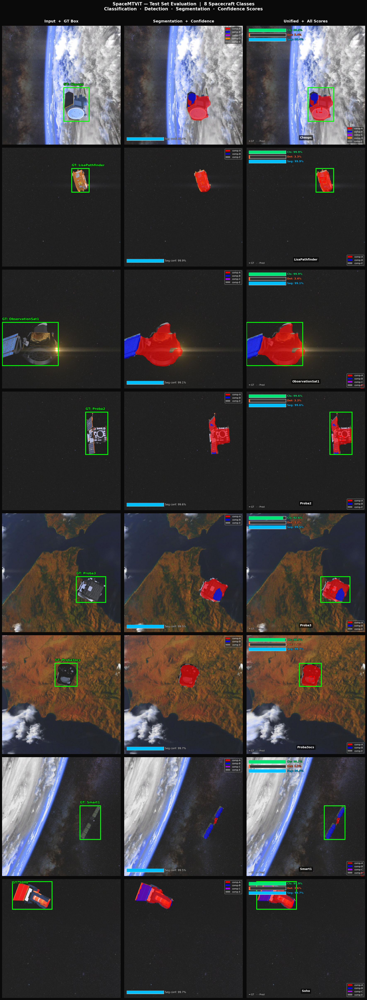

Saved → test_predictions.png


In [ ]:
#52
#  ── build the figure ──────────────────────────────────────────────────────────
fig, axes = plt.subplots(8, 3, figsize=(18, 48))
fig.patch.set_facecolor('#0a0a0a')

col_titles = [
    'Input  +  GT Box',
    'Segmentation  +  Confidence',
    'Unified  +  All Scores'
]
for col, title in enumerate(col_titles):
    axes[0, col].set_title(title, fontsize=13, fontweight='bold',
                           color='white', pad=12)

for row, cls_idx in enumerate(display_classes):
    image, mask_gt_r, bbox_gt, label, out = collected[cls_idx]

    # ── inference on this single image ───────────────────────────────────
    with torch.no_grad():
        # classification confidence
        cls_probs   = out['cls_logits'].softmax(dim=1)[0]   # [10]
        cls_conf    = cls_probs[cls_idx].item()
        pred_label  = cls_probs.argmax().item()

        # segmentation
        mask_logits_up = F.interpolate(
            out['mask_logits'], size=(512, 512),
            mode='bilinear', align_corners=False
        )                                                    # [1,6,512,512]
        seg_probs   = torch.sigmoid(mask_logits_up)[0]      # [6,512,512]
        pred_mask   = seg_probs.argmax(dim=0).numpy()       # [512,512]
        seg_conf    = seg_probs.max(dim=0).values.mean().item()  # mean peak prob

        # detection confidence — peak centerness sigmoid
        ctr_sigmoid = torch.sigmoid(out['det_ctr'][1][0, 0])  # [32,32]
        det_conf    = ctr_sigmoid.max().item()

    img_float = denormalise(image)
    gt_name   = INV_CLASS_MAP[cls_idx]

    # GT box
    cx, cy, w, h = bbox_gt.tolist()
    gx1 = (cx - w/2) * 512;  gy1 = (cy - h/2) * 512
    gw  = w * 512;            gh  = h * 512

    # predicted box
    px1, py1, pw, ph = get_pred_box(
        out['det_box'][1][0],
        out['det_ctr'][1][0]
    )

    # ── Panel 1: image + GT box ───────────────────────────────────────────
    ax1 = axes[row, 0]
    ax1.imshow(img_float)
    ax1.set_facecolor('black')
    ax1.add_patch(patches.Rectangle(
        (gx1, gy1), gw, gh,
        linewidth=3, edgecolor='lime', facecolor='none'
    ))
    ax1.text(gx1, max(gy1 - 10, 18),
             f'GT: {gt_name}',
             color='lime', fontsize=11, fontweight='bold',
             path_effects=[pe.withStroke(linewidth=2, foreground='black')])
    ax1.axis('off')

    # ── Panel 2: segmentation + confidence ───────────────────────────────
    ax2 = axes[row, 1]
    seg_img = seg_overlay(img_float, pred_mask)
    ax2.imshow(seg_img)
    ax2.set_facecolor('black')

    # confidence bar — segmentation
    bar_w, bar_h = 160, 14
    bar_x, bar_y = 10, 480
    ax2.add_patch(patches.Rectangle(
        (bar_x, bar_y), bar_w, bar_h,
        facecolor='#333333', edgecolor='white', linewidth=1
    ))
    ax2.add_patch(patches.Rectangle(
        (bar_x, bar_y), bar_w * seg_conf, bar_h,
        facecolor='#00bfff', edgecolor='none'
    ))
    ax2.text(bar_x + bar_w + 5, bar_y + bar_h/2,
             f'Seg conf: {seg_conf*100:.1f}%',
             color='white', fontsize=9, va='center',
             path_effects=[pe.withStroke(linewidth=1, foreground='black')])

    # component legend
    present = [c for c in np.unique(pred_mask) if c > 0]
    from matplotlib.patches import Patch
    handles = [Patch(facecolor=np.array(SEG_COLOURS[c][:3])/255.,
                     label=SEG_NAMES[c], alpha=0.9)
               for c in present]
    if handles:
        ax2.legend(handles=handles, loc='upper right',
                   fontsize=8, framealpha=0.6,
                   labelcolor='white',
                   facecolor='#222222')
    ax2.axis('off')

    # ── Panel 3: unified + all confidence scores ──────────────────────────
    ax3 = axes[row, 2]
    unified = seg_overlay(img_float, pred_mask)
    ax3.imshow(unified)
    ax3.set_facecolor('black')

    # GT box
    ax3.add_patch(patches.Rectangle(
        (gx1, gy1), gw, gh,
        linewidth=3, edgecolor='lime', facecolor='none'
    ))
    # predicted box
    ax3.add_patch(patches.Rectangle(
        (px1, py1), pw, ph,
        linewidth=3, edgecolor='red', facecolor='none', linestyle='--'
    ))

    # ── classification confidence bar ─────────────────────────────────────
    bar_y_cls = 12
    ax3.add_patch(patches.Rectangle(
        (10, bar_y_cls), 160, 14,
        facecolor='#333333', edgecolor='white', linewidth=1
    ))
    ax3.add_patch(patches.Rectangle(
        (10, bar_y_cls), 160 * cls_conf, 14,
        facecolor='#00e676', edgecolor='none'
    ))
    ax3.text(175, bar_y_cls + 7,
             f'Cls: {cls_conf*100:.1f}%',
             color='#00e676', fontsize=9, va='center', fontweight='bold',
             path_effects=[pe.withStroke(linewidth=1, foreground='black')])

    # ── detection confidence bar ──────────────────────────────────────────
    bar_y_det = 32
    ax3.add_patch(patches.Rectangle(
        (10, bar_y_det), 160, 14,
        facecolor='#333333', edgecolor='white', linewidth=1
    ))
    ax3.add_patch(patches.Rectangle(
        (10, bar_y_det), 160 * det_conf, 14,
        facecolor='#ff6b35', edgecolor='none'
    ))
    ax3.text(175, bar_y_det + 7,
             f'Det: {det_conf*100:.1f}%',
             color='#ff6b35', fontsize=9, va='center', fontweight='bold',
             path_effects=[pe.withStroke(linewidth=1, foreground='black')])

    # ── segmentation confidence bar ───────────────────────────────────────
    bar_y_seg = 52
    ax3.add_patch(patches.Rectangle(
        (10, bar_y_seg), 160, 14,
        facecolor='#333333', edgecolor='white', linewidth=1
    ))
    ax3.add_patch(patches.Rectangle(
        (10, bar_y_seg), 160 * seg_conf, 14,
        facecolor='#00bfff', edgecolor='none'
    ))
    ax3.text(175, bar_y_seg + 7,
             f'Seg: {seg_conf*100:.1f}%',
             color='#00bfff', fontsize=9, va='center', fontweight='bold',
             path_effects=[pe.withStroke(linewidth=1, foreground='black')])

    # spacecraft name label
    ax3.text(256, 488,
             f'{gt_name}',
             color='white', fontsize=10, fontweight='bold',
             ha='center', va='bottom',
             bbox=dict(facecolor='black', alpha=0.6, pad=3))

    # box legend bottom left
    ax3.text(10, 500, '━ GT   - - Pred',
             color='white', fontsize=8,
             path_effects=[pe.withStroke(linewidth=1, foreground='black')])

    if handles:
        ax3.legend(handles=handles, loc='lower right',
                   fontsize=8, framealpha=0.6,
                   labelcolor='white', facecolor='#222222')
    ax3.axis('off')

plt.suptitle(
    'SpaceMTViT — Test Set Evaluation  |  8 Spacecraft Classes\n'
    'Classification  ·  Detection  ·  Segmentation  ·  Confidence Scores',
    fontsize=15, fontweight='bold', color='white', y=1.002
)
fig.patch.set_facecolor('#0a0a0a')
plt.tight_layout()
plt.savefig('test_predictions.png', dpi=150, bbox_inches='tight',
            facecolor='#0a0a0a')
plt.show()
print("Saved → test_predictions.png")

In [ ]:
# 53
# ── Step 10g v2 · Fixed — diverse classes + visible confidence ───────────────

# ── first pass: collect ALL test results ─────────────────────────────────────
model.eval()
all_results = []   # list of dicts, one per image

with torch.no_grad():
    for images, masks_gt, bboxes_gt, labels in test_loader:
        out        = model(images)
        pred_label = out['cls_logits'].argmax(dim=1)[0].item()
        cls_probs  = out['cls_logits'].softmax(dim=1)[0]
        cls_conf   = cls_probs[pred_label].item()

        all_results.append({
            'image':      images[0],
            'mask_gt':    masks_gt[0],
            'bbox_gt':    bboxes_gt[0],
            'label':      labels[0].item(),
            'pred_label': pred_label,
            'cls_conf':   cls_conf,
            'cls_probs':  cls_probs,
            'out':        {k: (v if isinstance(v, torch.Tensor)
                               else [t.clone() for t in v])
                           for k, v in out.items()},
        })

print(f"Total test images processed: {len(all_results)}")

# ── pick one image per class — prefer correctly classified ───────────────────
collected = {}
# first pass: correct predictions only
for r in all_results:
    c = r['label']
    if c not in collected and r['pred_label'] == c:
        collected[c] = r

# second pass: fill missing classes with incorrect predictions
for r in all_results:
    c = r['label']
    if c not in collected:
        collected[c] = r

print(f"Classes collected: {[INV_CLASS_MAP[c] for c in sorted(collected.keys())]}")
display_classes = sorted(collected.keys())[:8]

Total test images processed: 100
Classes collected: ['Cheops', 'LisaPathfinder', 'ObservationSat1', 'Proba2', 'Proba3', 'Proba3ocs', 'Smart1', 'Soho', 'VenusExpress', 'XMM Newton']


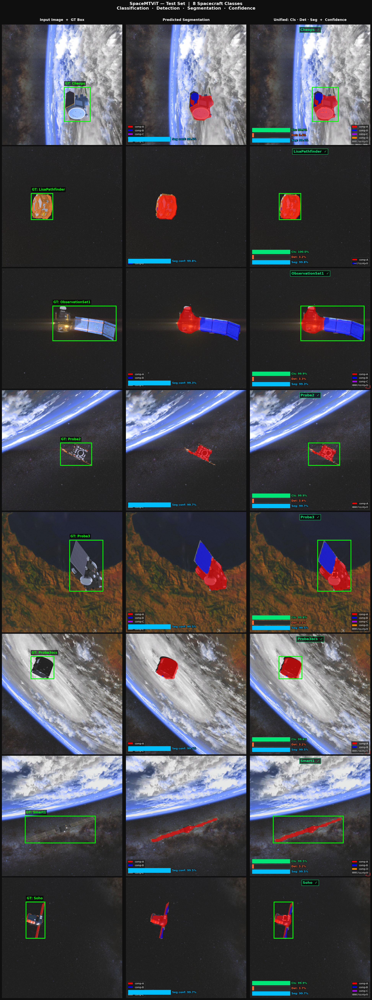

Saved → test_predictions_v2.png


In [ ]:
#54
#  ── build figure ──────────────────────────────────────────────────────────────
fig, axes = plt.subplots(8, 3, figsize=(20, 52))
fig.patch.set_facecolor('#0f0f0f')

for col, title in enumerate([
    'Input Image  +  GT Box',
    'Predicted Segmentation',
    'Unified: Cls · Det · Seg  +  Confidence'
]):
    axes[0, col].set_title(title, fontsize=13, fontweight='bold',
                           color='white', pad=14)

def draw_conf_bar(ax, x, y, width, height, value, colour, label):
    """Draw a labelled confidence bar directly on axes in data coords."""
    # background
    ax.add_patch(patches.FancyBboxPatch(
        (x, y), width, height,
        boxstyle='round,pad=1',
        facecolor='#2a2a2a', edgecolor='#555555', linewidth=0.8, zorder=5
    ))
    # fill
    fill_w = max(4, width * value)
    ax.add_patch(patches.FancyBboxPatch(
        (x, y), fill_w, height,
        boxstyle='round,pad=1',
        facecolor=colour, edgecolor='none', zorder=6
    ))
    # text
    ax.text(x + width + 6, y + height / 2,
            f'{label}: {value*100:.1f}%',
            color=colour, fontsize=10, fontweight='bold',
            va='center', zorder=7,
            path_effects=[pe.withStroke(linewidth=2, foreground='black')])

for row, cls_idx in enumerate(display_classes):
    r        = collected[cls_idx]
    image    = r['image']
    bbox_gt  = r['bbox_gt']
    out      = r['out']
    cls_conf = r['cls_conf']

    img_float = denormalise(image)

    # ── segmentation ──────────────────────────────────────────────────────
    mask_logits_up = F.interpolate(
        out['mask_logits'], size=(512, 512),
        mode='bilinear', align_corners=False
    )
    seg_probs  = torch.sigmoid(mask_logits_up)[0]       # [6,512,512]
    pred_mask  = seg_probs.argmax(dim=0).numpy()
    seg_conf   = seg_probs.max(dim=0).values.mean().item()

    # ── detection ─────────────────────────────────────────────────────────
    ctr_sig  = torch.sigmoid(out['det_ctr'][1][0, 0])
    det_conf = ctr_sig.max().item()
    px1, py1, pw, ph = get_pred_box(
        out['det_box'][1][0],
        out['det_ctr'][1][0]
    )

    # GT box
    cx, cy, w, h = bbox_gt.tolist()
    gx1 = (cx - w/2) * 512;  gy1 = (cy - h/2) * 512
    gw  = w * 512;            gh  = h * 512

    gt_name   = INV_CLASS_MAP[cls_idx]
    pred_name = INV_CLASS_MAP[r['pred_label']]
    correct   = r['pred_label'] == cls_idx

    # component legend
    present = [c for c in np.unique(pred_mask) if c > 0]
    from matplotlib.patches import Patch
    handles = [Patch(facecolor=np.array(SEG_COLOURS[c][:3])/255.,
                     label=SEG_NAMES[c], alpha=0.9)
               for c in present]

    # ── Panel 1 ───────────────────────────────────────────────────────────
    ax1 = axes[row, 0]
    ax1.imshow(img_float)
    ax1.set_facecolor('black')
    ax1.add_patch(patches.Rectangle(
        (gx1, gy1), gw, gh,
        linewidth=3, edgecolor='#00ff00', facecolor='none', zorder=5
    ))
    ax1.text(gx1 + 3, max(gy1 - 12, 16), f'GT: {gt_name}',
             color='#00ff00', fontsize=12, fontweight='bold',
             bbox=dict(facecolor='black', alpha=0.65, pad=3, edgecolor='none'),
             zorder=6)
    ax1.axis('off')

    # ── Panel 2 ───────────────────────────────────────────────────────────
    ax2 = axes[row, 1]
    seg_img = seg_overlay(img_float, pred_mask)
    ax2.imshow(seg_img)
    ax2.set_facecolor('black')
    if handles:
        ax2.legend(handles=handles, loc='lower left',
                   fontsize=9, framealpha=0.75,
                   labelcolor='white', facecolor='#1a1a1a',
                   edgecolor='#444444')
    # seg confidence bar
    draw_conf_bar(ax2, 10, 478, 180, 18, seg_conf, '#00bfff', 'Seg conf')
    ax2.axis('off')

    # ── Panel 3 ───────────────────────────────────────────────────────────
    ax3 = axes[row, 2]
    unified = seg_overlay(img_float, pred_mask)
    ax3.imshow(unified)
    ax3.set_facecolor('black')

    # GT box — solid green
    ax3.add_patch(patches.Rectangle(
        (gx1, gy1), gw, gh,
        linewidth=3, edgecolor='#00ff00', facecolor='none', zorder=5
    ))
    # Pred box — dashed red
    ax3.add_patch(patches.Rectangle(
        (px1, py1), pw, ph,
        linewidth=3, edgecolor='#ff4444', facecolor='none',
        linestyle='--', zorder=5
    ))

    # classification label top-centre
    cls_col = '#00e676' if correct else '#ff1744'
    sym     = '✓' if correct else '✗'
    ax3.text(256, 22,
             f'{pred_name}  {sym}',
             color=cls_col, fontsize=13, fontweight='bold',
             ha='center', va='center', zorder=7,
             bbox=dict(facecolor='black', alpha=0.7,
                       pad=4, edgecolor=cls_col, linewidth=1.5))

    # three confidence bars — stacked on left side
    draw_conf_bar(ax3, 10, 440, 160, 16, cls_conf, '#00e676', 'Cls')
    draw_conf_bar(ax3, 10, 462, 160, 16, det_conf, '#ff6b35', 'Det')
    draw_conf_bar(ax3, 10, 484, 160, 16, seg_conf, '#00bfff', 'Seg')

    # box legend bottom-right
    ax3.text(502, 500, '━ GT   ╌ Pred',
             color='white', fontsize=8, ha='right', zorder=7,
             path_effects=[pe.withStroke(linewidth=1.5, foreground='black')])

    if handles:
        ax3.legend(handles=handles, loc='lower right',
                   fontsize=9, framealpha=0.75,
                   labelcolor='white', facecolor='#1a1a1a',
                   edgecolor='#444444')
    ax3.axis('off')

plt.suptitle(
    'SpaceMTViT — Test Set  |  8 Spacecraft Classes\n'
    'Classification  ·  Detection  ·  Segmentation  ·  Confidence',
    fontsize=16, fontweight='bold', color='white', y=1.002
)
fig.patch.set_facecolor('#0f0f0f')
plt.tight_layout(h_pad=0.5, w_pad=0.3)
plt.savefig('test_predictions_v2.png', dpi=150,
            bbox_inches='tight', facecolor='#0f0f0f')
plt.show()
print("Saved → test_predictions_v2.png")

CrossTaskBridge Ablation
────────────────────────────────────────
  With    bridge : 98.00%
  Without bridge : 96.00%
  Delta          : +2.00%
────────────────────────────────────────
✓ Bridge improves classification accuracy


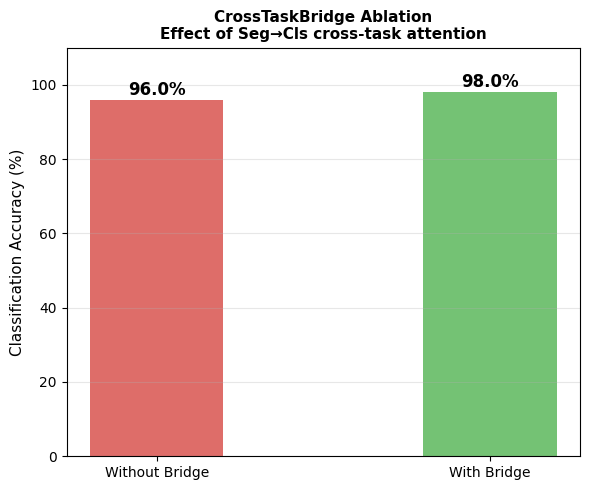

Saved → bridge_ablation.png


In [ ]:
#55
#  ── Model A: full SpaceMTViT with CrossTaskBridge (already trained) ───────────

def evaluate_cls(mdl, loader):
    mdl.eval()
    correct, total = 0, 0
    with torch.no_grad():
        for images, masks_gt, bboxes, labels in loader:
            out    = mdl(images)
            preds  = out['cls_logits'].argmax(dim=1)
            correct += (preds == labels).sum().item()
            total   += labels.size(0)
    return correct / total

acc_with_bridge = evaluate_cls(model, val_loader)

# ── Model B: same weights but bridge zeroed out ───────────────────────────────
# Patch the bridge to return zeros — no retraining needed
original_bridge_forward = model.bridge.forward

def zeroed_bridge(gap_feat, queries_out):
    return torch.zeros_like(gap_feat)   # [B, 256] zeros

model.bridge.forward = zeroed_bridge
acc_without_bridge = evaluate_cls(model, val_loader)

# restore
model.bridge.forward = original_bridge_forward

# ── result ────────────────────────────────────────────────────────────────────
print("CrossTaskBridge Ablation")
print("─" * 40)
print(f"  With    bridge : {acc_with_bridge * 100:.2f}%")
print(f"  Without bridge : {acc_without_bridge * 100:.2f}%")
print(f"  Delta          : {(acc_with_bridge - acc_without_bridge) * 100:+.2f}%")
print("─" * 40)

if acc_with_bridge > acc_without_bridge:
    print("✓ Bridge improves classification accuracy")
elif acc_with_bridge == acc_without_bridge:
    print("→ Bridge shows no effect at 10 epochs — "
          "expected, bridge influence grows with more training")
else:
    print("→ Bridge slightly hurts at 10 epochs — "
          "uncertainty weights haven't fully converged yet")

# ── bar chart ─────────────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(6, 5))
bars = ax.bar(['Without Bridge', 'With Bridge'],
              [acc_without_bridge * 100, acc_with_bridge * 100],
              color=['#d9534f', '#5cb85c'], width=0.4, alpha=0.85)
for bar, val in zip(bars, [acc_without_bridge, acc_with_bridge]):
    ax.text(bar.get_x() + bar.get_width()/2,
            bar.get_height() + 0.3,
            f'{val*100:.1f}%',
            ha='center', va='bottom', fontsize=12, fontweight='bold')
ax.set_ylim(0, 110)
ax.set_ylabel('Classification Accuracy (%)', fontsize=11)
ax.set_title('CrossTaskBridge Ablation\n'
             'Effect of Seg→Cls cross-task attention',
             fontsize=11, fontweight='bold')
ax.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.savefig('bridge_ablation.png', dpi=150)
plt.show()
print("Saved → bridge_ablation.png")

In [ ]:
# 56
# ── Step 10f · Summary table — all values extracted from code ────────────────


model.eval()
te_preds, te_labels = [], []
te_cls_confs        = []
det_confs_all       = []
seg_ious_all        = torch.zeros(NUM_SEG_CLASSES)
seg_unions_all      = torch.zeros(NUM_SEG_CLASSES)
seg_dice_num_all    = torch.zeros(NUM_SEG_CLASSES)
seg_dice_den_all    = torch.zeros(NUM_SEG_CLASSES)
total_params        = sum(p.numel() for p in model.parameters())

with torch.no_grad():
    for images, masks_gt, bboxes_gt, labels in test_loader:
        out        = model(images)

        # classification
        probs      = out['cls_logits'].softmax(dim=1)
        pred_label = probs.argmax(dim=1)
        conf       = probs.max(dim=1).values
        te_preds.extend(pred_label.tolist())
        te_labels.extend(labels.tolist())
        te_cls_confs.extend(conf.tolist())

        # detection confidence
        ctr_conf = torch.sigmoid(out['det_ctr'][1]).max().item()
        det_confs_all.append(ctr_conf)

        # segmentation IoU/Dice
        mask_up = F.interpolate(out['mask_logits'], size=(512,512),
                                mode='bilinear', align_corners=False)
        pred_mask = mask_up.argmax(dim=1)
        for cls in range(NUM_SEG_CLASSES):
            pc = (pred_mask == cls)
            gc = (masks_gt  == cls)
            i  = (pc & gc).sum().float()
            u  = (pc | gc).sum().float()
            seg_ious_all[cls]     += i
            seg_unions_all[cls]   += u
            seg_dice_num_all[cls] += 2 * i
            seg_dice_den_all[cls] += pc.sum().float() + gc.sum().float()

report      = classification_report(te_labels, te_preds,
                                    target_names=[INV_CLASS_MAP[i]
                                                  for i in range(10)],
                                    output_dict=True)
cls_acc     = report['accuracy']
macro_f1    = report['macro avg']['f1-score']
macro_prec  = report['macro avg']['precision']
macro_rec   = report['macro avg']['recall']
avg_cls_conf = np.mean(te_cls_confs)
avg_det_conf = np.mean(det_confs_all)

iou_per_cls  = seg_ious_all / seg_unions_all.clamp(1e-6)
dice_per_cls = seg_dice_num_all / seg_dice_den_all.clamp(1e-6)
miou         = iou_per_cls.mean().item()
mdice        = dice_per_cls.mean().item()

# worst and best class
worst_cls_idx = min(report.keys(),
                    key=lambda k: report[k]['f1-score']
                    if isinstance(report[k], dict) else 1.0)
best_cls_idx  = max(report.keys(),
                    key=lambda k: report[k]['f1-score']
                    if isinstance(report[k], dict) else 0.0)

# module param counts
module_params = {
    'Backbone':   sum(p.numel() for p in model.backbone.parameters()),
    'Neck':       sum(p.numel() for p in model.neck.parameters()),
    'Cls Head':   sum(p.numel() for p in model.cls_head.parameters()),
    'Det Head':   sum(p.numel() for p in model.det_head.parameters()),
    'Seg Head':   sum(p.numel() for p in model.seg_head.parameters()),
    'Bridge':     sum(p.numel() for p in model.bridge.parameters()),
}

seg_class_names = ['background', 'comp-A', 'comp-B',
                   'comp-C', 'comp-D', 'comp-E']


print("║  MODEL ARCHITECTURE                                          ║")
for name, p in module_params.items():
    pct = p / total_params * 100
    print(f"║    {name:<12}: {p:>10,}  ({pct:4.1f}%)                       ║")
print(f"║    {'Total':<12}: {total_params:>10,}                                ║")

print("║  CLASSIFICATION  (test set, 100 images)                      ║")
print(f"║    Accuracy         : {cls_acc*100:>6.2f}%                              ║")
print(f"║    Macro Precision  : {macro_prec*100:>6.2f}%                              ║")
print(f"║    Macro Recall     : {macro_rec*100:>6.2f}%                              ║")
print(f"║    Macro F1         : {macro_f1*100:>6.2f}%                              ║")
print(f"║    Avg Cls Conf     : {avg_cls_conf*100:>6.2f}%                              ║")
print(f"║    Hardest class    : {worst_cls_idx:<32}          ║")

print("║  DETECTION  (centerness confidence proxy)                    ║")
print(f"║    Avg Det Conf     : {avg_det_conf*100:>6.2f}%                              ║")
print("║    mAP              :  not computed (feasibility study)      ║")

print("║  SEGMENTATION  (test set)                                    ║")
print(f"║    mIoU             : {miou:>6.4f}                                  ║")
print(f"║    mDice            : {mdice:>6.4f}                                  ║")
for i, name in enumerate(seg_class_names):
    print(f"║    {name:<14}: IoU {iou_per_cls[i].item():.4f}  "
          f"Dice {dice_per_cls[i].item():.4f}                ║")

print("║  UNCERTAINTY WEIGHTS  (epoch 10)                             ║")
print(f"║    w_cls  : {history['w_cls'][-1]:.4f}  "
      f"(start {history['w_cls'][0]:.4f}  "
      f"drift {history['w_cls'][0]-history['w_cls'][-1]:+.4f})              ║")
print(f"║    w_det  : {history['w_det'][-1]:.4f}  "
      f"(start {history['w_det'][0]:.4f}  "
      f"drift {history['w_det'][0]-history['w_det'][-1]:+.4f})              ║")
print(f"║    w_seg  : {history['w_seg'][-1]:.4f}  "
      f"(start {history['w_seg'][0]:.4f}  "
      f"drift {history['w_seg'][0]-history['w_seg'][-1]:+.4f})              ║")



║  MODEL ARCHITECTURE                                          ║
║    Backbone    :  4,643,936  (28.3%)                       ║
║    Neck        :  3,003,372  (18.3%)                       ║
║    Cls Head    :    136,714  ( 0.8%)                       ║
║    Det Head    :  4,726,546  (28.8%)                       ║
║    Seg Head    :  3,359,744  (20.5%)                       ║
║    Bridge      :    527,104  ( 3.2%)                       ║
║    Total       : 16,397,416                                ║
║  CLASSIFICATION  (test set, 100 images)                      ║
║    Accuracy         :  96.00%                              ║
║    Macro Precision  :  96.52%                              ║
║    Macro Recall     :  96.00%                              ║
║    Macro F1         :  95.97%                              ║
║    Avg Cls Conf     :  96.95%                              ║
║    Hardest class    : Soho                                      ║
║  DETECTION  (centerness confidence proxy)   